In [441]:
pip install yfinance

--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1673, in print
    extend(render(renderable, render_options))
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1305, in render
    for render_output in iter_render:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/segment.py", line 249, in split_lines
    for segment in segments:
  File "/Library/

In [442]:
pip install update pandas_datareader

--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1673, in print
    extend(render(renderable, render_options))
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1305, in render
    for render_output in iter_render:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/segment.py", line 249, in split_lines
    for segment in segments:
  File "/Library/

In [443]:
pip install tqdm

--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1673, in print
    extend(render(renderable, render_options))
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1305, in render
    for render_output in iter_render:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/segment.py", line 249, in split_lines
    for segment in segments:
  File "/Library/

In [444]:
from tqdm import tqdm, trange

In [445]:
import pandas as pd
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from scipy.stats import ranksums
from scipy.stats import shapiro
from scipy.stats import ttest_ind
from IPython.display import display

%matplotlib inline

In [446]:
yf.pdr_override()

In [447]:
# here we look at stcoks from all the sectors of the market
sectors = ['Tech','Healthcare','Financial','Consumer_D','Consumer_S','Industrial','Energy','Utility','Market_ETF']
Tech_stocks=['AAPL','MSFT','NVDA','ADBE','CRM','GOOGL','AMZN','IBM','INTC','CSCO']
Healthcare_stocks=['JNJ','PFE','MRK','GILD','AMGN','BMY','LLY','REGN','UNH']
Financial_stocks=["JPM", "BAC", "WFC", "C", "GS", "MS", "V", "MA", "AXP", "SCHW"]
Consumer_D_stocks = ["HD", "MCD", "NKE", "SBUX", "DIS", "CMCSA", "LOW", "F", "BKNG"] # Consumer discretionary
Consumer_S_stocks= ["PG", "KO", "PEP", "WMT", "CL", "KMB", "CLX", "MDLZ", "EL"] #Consumer Staples
Industrial_stocks = ["BA", "GE", "MMM", "HON", "CAT", "RTX", "LMT", "GD", "UNP", "FDX"]
Energy_stocks = ["XOM", "CVX", "BP", "COP", "EOG", "OXY", "SLB", "WMB"]
Utility_stocks = ["NEE", "DUK", "D", "SO", "EXC", "AEP", "SRE", "XEL", "WEC", "AWK"]
Market_ETF_stocks = ['SPY','QQQ']

### Asset selection for tests
Selected a basket of stocks from each sector for running and analysing the stocks and their sector wise dependence.

pros- can identify the sector wise dependence of stocks on indicators 

cons - survivorship bias as some stocks might delisted or just added 
overfitting bias as we are cherry picking stocks based on p value 


In [448]:
lookbacks=[9,20,50,100,200]
strat_lookbacks = [9,20,30,50,75,100,150,200]
fixed_stoplosses = [None,0.5,1,2,3,4,5]

In [449]:
start='2005-01-01'
end='2010-01-01'

# Strategy Hypothesis

Use one tailed paired t-test for confirming this hypothesis

Instead of checking for daily returns we are going to check for cummulative returns.
we can do this by testing the strategy compared to that of a benchmark strategy sucha s a buy and hold. 
we test the hypothesis that the cummulative returns generated by the strategy are not different from that generated by the Buy and hold strategy 

# VWAP Hypothesis

### Indicators
Trade indicators 
*   Volume weighted moving average price - with different lookbacks 
*   Fixed Stoplosses 
*   Historical Volatility of returns
*   Volatility from GARCH fit on Returns

Risk Indicators 
*   Fixed - fixed percentage value for all trades 
*   Flexible - value changes per trade based on 30 day GARCH volatility, or other parameters open to further research


### signals
*   signal(1) - previous close and current open crossing above VWAP
*   signal(2) - previous close and current open crossing below VWAP

### rules
*   long entry - close crossing above VWAP signal(1) - enter at days open
*   long exit - close crossing below VWAP signal(2) - exit at days open
*   short entry - close crossing below VWAP signal(2) - enter at days open
*   short exit - close crossing above VWAP signal(1) - exit at days open

### Risk Management - Fixed 
*   long trades fixed risk - checks if day's Low is below the Stoploss determined at entry
*   short trades fixed risk - checks if day's Low is above the Stoploss determined at entry

### Risk Management - Flexible 
*   long trades flexible risk - checks if day's Low is below the Stoploss determined at entry
*   short trades flexible risk - checks if day's Low is above the Stoploss determined at entry



In [450]:
pip install arch

--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1673, in print
    extend(render(renderable, render_options))
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/console.py", line 1305, in render
    for render_output in iter_render:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pip/_vendor/rich/segment.py", line 249, in split_lines
    for segment in segments:
  File "/Library/

In [451]:
from arch import arch_model
from multiprocessing import Pool

In [452]:
def fit_garch(data):
    '''This function is used to fit a GARCH (Generalized Autoregressive Conditional Heteroskedasticity) model on the provided data. 
    It returns the conditional volatility of the last data point. 
    The GARCH model is a statistical model used to estimate the volatility of stock returns.'''
    model = arch_model(data, vol='Garch', p=1, q=1)
    model_fit = model.fit(disp='off')
    return model_fit.conditional_volatility[-1]

In [453]:
def data_prep_VWAP2(symbol,VWAP_lookback,start,end,Garch_lookback=None,Vol_lookback=None,vol_multiplier=1):
  '''This function retrieves historical price and volume data for a specific stock symbol from Yahoo Finance, 
  calculates the VWAP and the returns, and also prepares the upper and lower band for the stop loss based on the type of 
  volatility (either historical or GARCH). It prepares the data to be used in the trading strategy.'''
  # Calculate the cumulative sum of price times volume
  df = yf.download(symbol,start,end)
  df['PV'] = df['Close'] * df['Volume']
  df['CumulativePV'] = df['PV'].rolling(VWAP_lookback).sum()
  # Calculate the cumulative sum of volume
  df['CumulativeVolume'] = df['Volume'].rolling(VWAP_lookback).sum()

  # Calculate the rolling VWAP
  df['RollingVWAP'] = df['CumulativePV'] / df['CumulativeVolume']
  df['returns']=(df['Close']-df['Close'].shift(1))/df['Close'].shift(1)
  df = df.dropna(axis=0).copy()
  if Vol_lookback != None:
    df['vol']=df['returns'].rolling(Vol_lookback).std()*100
    df['upper_band']=df['Open']*(1+df['vol']*vol_multiplier/100)
    df['lower_band']=df['Open']*(1-df['vol']*vol_multiplier/100)
  if Garch_lookback != None:
    df['scaled_returns']=df['returns']*100
    windows = [df.iloc[i-Garch_lookback:i]['scaled_returns'] for i in range(Garch_lookback, len(df))]
    volatilities = [fit_garch(window) for window in windows]
    df = df.iloc[Garch_lookback:] 
    df['vol'] = volatilities
    df['upper_band']=df['Open']*(1+df['vol']*vol_multiplier/100)
    df['lower_band']=df['Open']*(1-df['vol']*vol_multiplier/100)
    df = df.drop(columns=['scaled_returns']).copy()
  df = df.drop(columns=['CumulativePV','CumulativeVolume','PV']).copy()
  df = df.dropna(axis=0).copy()
  return df

In [454]:
aapl_dat=data_prep_VWAP2('AAPL',200,'2010-01-01','2012-01-01',Garch_lookback=30)

[*********************100%***********************]  1 of 1 completed


In [455]:
aapl_dat

,Open,High,Low,Close,Adj Close,Volume,RollingVWAP,returns,vol,upper_band,lower_band
Date,,,,,,,,,,,
2010-11-30,11.197857,11.227143,11.102500,11.112500,9.458054,501858000,9.305587,-0.018052,1.407437,11.355460,11.040254
2010-12-01,11.259643,11.348214,11.250000,11.300000,9.617634,461750800,9.320546,0.016873,1.453558,11.423308,11.095977
2010-12-02,11.340357,11.392857,11.246071,11.362500,9.670835,462837200,9.335472,0.005531,1.520380,11.512773,11.167940
2010-12-03,11.321786,11.380357,11.297857,11.337143,9.649249,342092800,9.348351,-0.002232,1.493180,11.490841,11.152731
2010-12-06,11.380000,11.511786,11.372143,11.433929,9.731626,448481600,9.363027,0.008537,1.436232,11.543443,11.216557
...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,14.274643,14.413929,14.267500,14.404643,12.260057,269399200,13.205375,0.011993,1.365770,14.469602,14.079684
2011-12-27,14.396429,14.610357,14.393571,14.518929,12.357327,265076000,13.211468,0.007934,1.336018,14.588768,14.204090
2011-12-28,14.531786,14.580357,14.333571,14.380000,12.239083,228662000,13.220629,-0.009569,1.232613,14.710907,14.352665


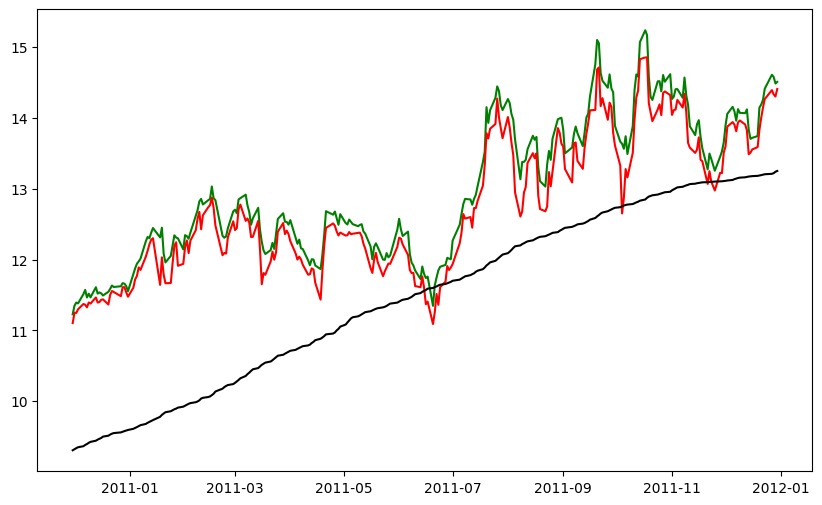

In [456]:
fig, ax = plt.subplots(figsize =(10,6))
ax.plot(aapl_dat['High'],c='green')
ax.plot(aapl_dat['Low'],c = 'red')
ax.plot(aapl_dat['RollingVWAP'],c='black')
plt.show()

Trade Entry :- we wait for close to cross above VWAP and then enter at next days Open
Exit :- Once the Close is  below the VWAP we exit the position and take a short on the next days open (Ignoring Slippage)

In [457]:
def VWAP_crossover(symbol,lookback,start,end,print_trades=False,stoploss_pct=None,vol_type=None,vol_lookback=None,vol_multiplier=1):
  '''This is the main function implementing the trading strategy. It uses the VWAP to determine when to enter and exit long and short trades. 
  It takes into account a fixed stop loss or a flexible stop loss based on volatility (either historical or GARCH). 
  The function records every trade made (including entry and exit dates and prices, direction, and return) and also calculates the cumulative return of the strategy.

  The trading strategy goes as follows:

A long trade is entered when the previous day's close and the current day's open are above the VWAP, 
and exited when the current day's open is below the VWAP or when the stop loss is triggered.
A short trade is entered when the previous day's close and the current day's open are below the VWAP, 
and exited when the current day's open is above the VWAP or when the stop loss is triggered.
The stop loss can either be a fixed percentage or a flexible stop loss that adjusts based on the historical or GARCH volatility.'''
  trades = {'long':{},'short':{}}
  long_trade_no = 1
  short_trade_no = 1
  flexible_stoploss = False
  if vol_type != None and vol_lookback != None:
    flexible_stoploss = True
    if vol_type == 'hist':
      df = data_prep_VWAP2(symbol,lookback,start,end,Vol_lookback=vol_lookback,vol_multiplier=vol_multiplier)
    elif vol_type == 'garch':
      df = data_prep_VWAP2(symbol,lookback,start,end,Garch_lookback=vol_lookback,vol_multiplier=vol_multiplier)
    else:
      print('invalid vol_type')
      df = data_prep_VWAP2(symbol,lookback,start,end) # prepares the dataset      
  else:
    df = data_prep_VWAP2(symbol,lookback,start,end) # prepares the dataset
  df['long_strat_returns']=np.zeros(len(df)) # initialise the strategy column
  df['short_strat_returns']=np.zeros(len(df))
  df['long_stoploss']=np.zeros(len(df)) # tracks the fixed or flexible stoploss 
  df['short_stoploss']=np.full(len(df),100000)
  df['strat_returns']=np.zeros(len(df))
  long_side = False # sets long and short trade indicator to false 
  short_side= False
  long_SL = False # Tracks if Stoploss was hit
  short_SL = False
  just_entered_short = False
  just_entered_long = False
  for date in df.index:
    just_entered_short = False
    just_entered_long = False
    # Long Trades
    #checks if trend has changed and resets the long side and long SL
    if df.loc[date,'Open'] < df.loc[date,'RollingVWAP']:
      # checks if trade has been closed else it closes it and records it 
      if not long_SL and long_side:
        if print_trades:
          print(f"long trade closed at  {df.loc[date,'Open']} due to regime shift")
        # grabs overnight returns as we close trade at the close 
        df.loc[date,'long_strat_returns'] = (df.loc[date,'Open']-df.loc[:date,'Close'][-1])/df.loc[:date,'Close'][-1]
        # tracks trade close 
        trades['long'][long_trade_no]['exit date']=date
        trades['long'][long_trade_no]['exit price']= df.loc[date,'Open']
        trades['long'][long_trade_no]['return']=(trades['long'][long_trade_no]['exit price']-trades['long'][long_trade_no]['entry price'])/trades['long'][long_trade_no]['entry price']
        long_trade_no = long_trade_no + 1   
      # resets all booleans 
      long_side = False
      long_SL = False
    # checks if long trade are active and Sl hasnt been hit
    if long_side and not long_SL:
      # appends daily returns - helps us track the growth of profits 
      df.loc[date,'long_strat_returns'] = df.loc[date,'returns']
    # checks if previous close and open are above threshold - condition for long trade entry
    if df.loc[:date,'Close'][-1] > df.loc[date,'RollingVWAP'] and df.loc[date,'Open'] > df.loc[date,'RollingVWAP'] and not long_SL and not long_side:
      just_entered_long=True
      if print_trades:
        print(f"entered long trade {df.loc[date,'Open']} vwap {df.loc[date,'RollingVWAP']}")
      # records new trade entry exit and date  
      trades['long'][long_trade_no]={}
      trades['long'][long_trade_no]['direction']='long'
      trades['long'][long_trade_no]['entry date']=date
      trades['long'][long_trade_no]['entry price']= df.loc[date,'Open']
      # appends stoploss type based on stoploss values 
      if stoploss_pct != None:
        SL = (1-stoploss_pct/100) * df.loc[date,'Open']
        df.loc[date:,'long_stoploss']=SL
      elif flexible_stoploss:
        SL = df.loc[date,'lower_band']
        df.loc[date:,'long_stoploss']=SL
      else:
        None
      trades['long'][long_trade_no]['stop loss'] = df.loc[date,'long_stoploss']
      long_side = True
      # takes the returns from open to close as we enter at the open 
      df.loc[date,'long_strat_returns'] = (df.loc[date,'Close']-df.loc[date,'Open'])/df.loc[date,'Open']
    # update trailing SL
    if flexible_stoploss:
      SL = np.maximum(df.loc[date,'lower_band'],df.loc[:date,'long_stoploss'][-1])
      df.loc[date:,'long_stoploss']=SL
    # checks if stoploss has been hit 
    if df.loc[date,'Low'] <= df.loc[date,'long_stoploss'] and long_side and not long_SL:
      SL_price=np.minimum(df.loc[date,'long_stoploss'],df.loc[date,'Open'])
      if print_trades:
        print(f"SL hit {SL_price} , Low {df.loc[date,'Low']}")
      trades['long'][long_trade_no]['exit date']=date
      trades['long'][long_trade_no]['exit price']= SL_price
      trades['long'][long_trade_no]['return']=(trades['long'][long_trade_no]['exit price']-trades['long'][long_trade_no]['entry price'])/trades['long'][long_trade_no]['entry price']
      long_trade_no = long_trade_no + 1      
      long_SL = True
      if just_entered_long:
        df.loc[date,'long_strat_returns'] = (SL_price-df.loc[date,'Open'])/df.loc[date,'Open']
      else:
        df.loc[date,'long_strat_returns'] = (SL_price-df.loc[:date,'Close'][-1])/df.loc[:date,'Close'][-1]


    # Short Trades
    #checks if trend has changed and resets the short side and short SL
    if df.loc[date,'Open'] > df.loc[date,'RollingVWAP']:
      # checks if trade has been closed else it closes it and records it 
      if not short_SL and short_side:
        if print_trades:
          print(f"short trade closed at  {df.loc[date,'Open']} due to regime shift")
        # grabs overnight returns as we close trade at the close 
        df.loc[date,'short_strat_returns'] = -(df.loc[date,'Open']-df.loc[:date,'Close'][-1])/df.loc[:date,'Close'][-1]
        # tracks trade close 
        trades['short'][short_trade_no]['exit date']=date
        trades['short'][short_trade_no]['exit price']= df.loc[date,'Open']
        trades['short'][short_trade_no]['return']=-(trades['short'][short_trade_no]['exit price']-trades['short'][short_trade_no]['entry price'])/trades['short'][short_trade_no]['entry price']
        short_trade_no = short_trade_no + 1   
      # resets all booleans 
      short_side = False
      short_SL = False
    # checks if short trade are active and Sl hasnt been hit
    if short_side and short_SL != True:
      df.loc[date,'short_strat_returns'] = -df.loc[date,'returns']
    # checks if previous close and open are below threshold - condition for short trade entry
    if df.loc[:date,'Close'][-1] < df.loc[date,'RollingVWAP'] and df.loc[date,'Open'] < df.loc[date,'RollingVWAP'] and not short_SL and not short_side:
      just_entered_short=True
      if print_trades:
        print(f"entered short trade {df.loc[date,'Open']} vwap {df.loc[date,'RollingVWAP']}")
      trades['short'][short_trade_no]={}
      trades['short'][short_trade_no]['direction']='short'
      trades['short'][short_trade_no]['entry date']=date
      trades['short'][short_trade_no]['entry price']= df.loc[date,'Open']
      # appends stoploss type based on stoploss type
      if stoploss_pct != None:
        SL = (1+stoploss_pct/100) * df.loc[date,'Open']
        df.loc[date:,'short_stoploss']=SL
      elif flexible_stoploss:
        SL = df.loc[date,'upper_band']
        df.loc[date:,'short_stoploss']=SL
      else:
        None
      trades['short'][short_trade_no]['stop loss'] = df.loc[date,'short_stoploss']
      short_side = True
      df.loc[date,'short_strat_returns'] = -(df.loc[date,'Close']-df.loc[date,'Open'])/df.loc[date,'Open']
    # updates trailing SL
    if flexible_stoploss:
      SL = np.minimum(df.loc[date,'upper_band'],df.loc[:date,'short_stoploss'][-1])
      df.loc[date:,'short_stoploss']=SL
    # checks if stoploss has been hit 
    if df.loc[date,'High'] >= df.loc[date,'short_stoploss'] and short_side and not short_SL:
      SL_price=np.maximum(df.loc[date,'short_stoploss'],df.loc[date,'Open'])
      if print_trades:
        print(f"SL hit {SL_price} , High {df.loc[date,'High']}")
      trades['short'][short_trade_no]['exit date']=date
      trades['short'][short_trade_no]['exit price']= SL_price
      trades['short'][short_trade_no]['return']= -(trades['short'][short_trade_no]['exit price']-trades['short'][short_trade_no]['entry price'])/trades['short'][short_trade_no]['entry price']
      short_trade_no=short_trade_no+1
      short_SL = True
      if just_entered_short:
        df.loc[date,'short_strat_returns'] = -(SL_price-df.loc[date,'Open'])/df.loc[date,'Open']
      else:
        df.loc[date,'short_strat_returns'] = -(SL_price-df.loc[:date,'Close'][-1])/df.loc[:date,'Close'][-1]
  df.loc[:,'strat_returns']=((1+df.loc[:,'short_strat_returns'])*(1+df.loc[:,'long_strat_returns']))-1
  return df,trades

In [458]:
ret,trades=VWAP_crossover('aapl',100,start='2010-01-01',end='2012-01-01',stoploss_pct=1,print_trades=True)

[*********************100%***********************]  1 of 1 completed
entered long trade 8.931428909301758 vwap 8.114254067036962
SL hit 8.84211462020874 , Low 8.70535659790039
entered long trade 9.467499732971191 vwap 8.879376248406059
SL hit 9.37282473564148 , Low 9.071429252624512
entered short trade 8.810357093811035 vwap 9.039701814103339
SL hit 8.898460664749146 , High 9.039285659790039
entered long trade 9.110357284545898 vwap 9.089867247806362
long trade closed at  11.930713653564453 due to regime shift
entered short trade 11.930713653564453 vwap 12.055934301949149
SL hit 12.050020790100097 , High 12.070713996887207
entered long trade 12.268214225769043 vwap 12.11437903851139
long trade closed at  12.114286422729492 due to regime shift
entered short trade 12.114286422729492 vwap 12.259703007262907
SL hit 12.235429286956787 , High 12.422499656677246
entered long trade 12.459643363952637 vwap 12.279124469267005
SL hit 12.33504693031311 , Low 12.308929443359375
entered short trade 

In [459]:
def Process_trades(trades):
  long_trades = pd.DataFrame.from_dict(trades['long'], orient='index')
  short_trades = pd.DataFrame.from_dict(trades['short'], orient='index')
  trade_df = pd.concat([long_trades,short_trades])
  trade_df = trade_df.sort_values('entry date')
  return trade_df

In [460]:
trade_df=Process_trades(trades)

In [461]:
trade_df

,direction,entry date,entry price,stop loss,exit date,exit price,return
1,long,2010-05-26,8.931429,8.842115,2010-05-26,8.842115,-0.010000
2,long,2010-07-21,9.467500,9.372825,2010-07-21,9.372825,-0.010000
1,short,2010-08-12,8.810357,8.898461,2010-08-12,8.898461,-0.010000
3,long,2010-09-03,9.110357,9.019254,2011-04-11,11.930714,0.309577
2,short,2011-04-11,11.930714,12.050021,2011-04-19,12.050021,-0.010000
4,long,2011-04-20,12.268214,12.145532,2011-05-16,12.114286,-0.012547
3,short,2011-05-16,12.114286,12.235429,2011-05-31,12.235429,-0.010000
5,long,2011-06-01,12.459643,12.335047,2011-06-01,12.335047,-0.010000
4,short,2011-06-03,12.256429,12.378993,2011-06-06,12.346429,-0.007343
5,short,2011-06-07,12.077500,12.198275,2011-07-01,12.198275,-0.010000


In [462]:
(trade_df['return']+1).cumprod()

1     0.990000
2     0.980100
1     0.970299
3     1.270681
2     1.257974
4     1.242191
3     1.229769
5     1.217471
4     1.208531
5     1.196446
6     1.283162
7     1.270330
6     1.257627
8     1.245051
7     1.232600
9     1.222704
8     1.219352
10         NaN
Name: return, dtype: float64

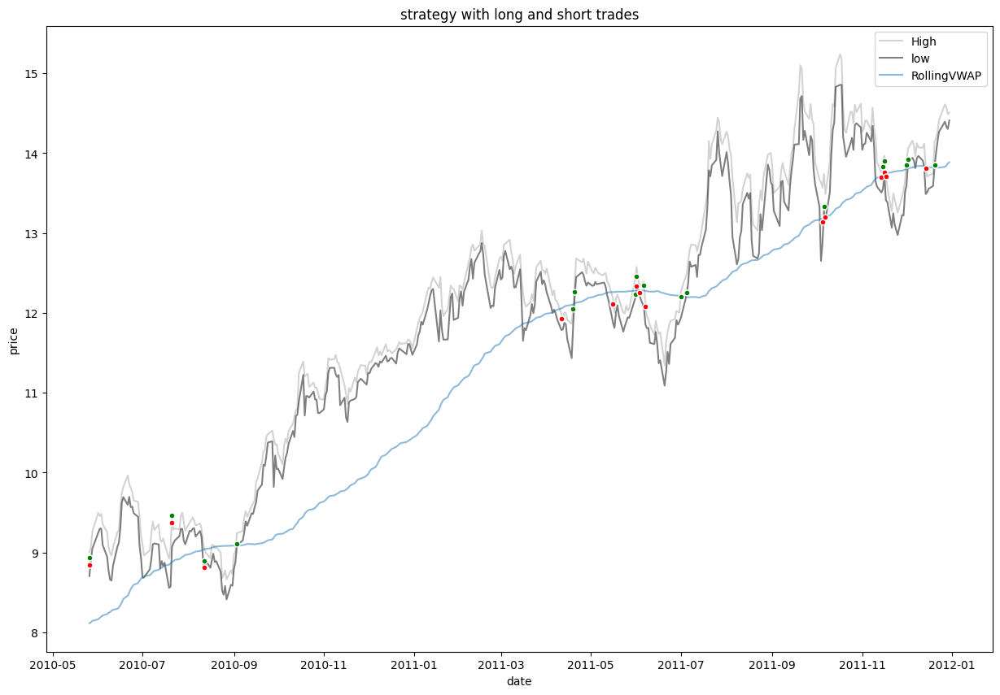

In [463]:
def plot_trades(ret,trade_df,indicator_list):
    fig, ax = plt.subplots(figsize =(15,10))
    ax.plot(ret['High'],c='lightgrey',label='High')
    ax.plot(ret['Low'],c = 'black',label='low',alpha = 0.5)
    for i in indicator_list:
        ax.plot(ret[i],label=i,alpha=0.5)
    for index,row in trade_df.iterrows():
        if row['direction']=='long':
            ax.plot(row['entry date'], row['entry price'], marker='.', markersize=10, markeredgecolor="white", markerfacecolor="green")
            ax.plot(row['exit date'], row['exit price'], marker='.', markersize=10, markeredgecolor="white", markerfacecolor="red")
        else:
            ax.plot(row['entry date'], row['entry price'], marker='.', markersize=10, markeredgecolor="white", markerfacecolor="red")
            ax.plot(row['exit date'], row['exit price'], marker='.', markersize=10, markeredgecolor="white", markerfacecolor="green")

    ax.set_xlabel('date')
    ax.set_ylabel('price')
    ax.set_title('strategy with long and short trades')
    plt.legend()
    plt.show()
plot_trades(ret,trade_df,['RollingVWAP'])

In [464]:
def plot_returns_comp(ret):
    fig, [ax1,ax2] = plt.subplots(2,figsize=(15,10))
    ax1.plot(ret['returns'],c='blue',label='benchmark',alpha=0.5)
    ax1.plot(ret['strat_returns'],c='red',label='strategy',alpha=0.5)
    ax1.set_xlabel('date')
    ax1.set_ylabel('percentage returns')
    ax1.set_title('daily returns')
    ax1.legend()

    ax2.plot(ret['strat_returns']-ret['returns'])
    ax2.set_xlabel('date')
    ax2.set_ylabel('percentage returns')
    ax2.set_title('Excess returns over and above benchmark')

    plt.show()

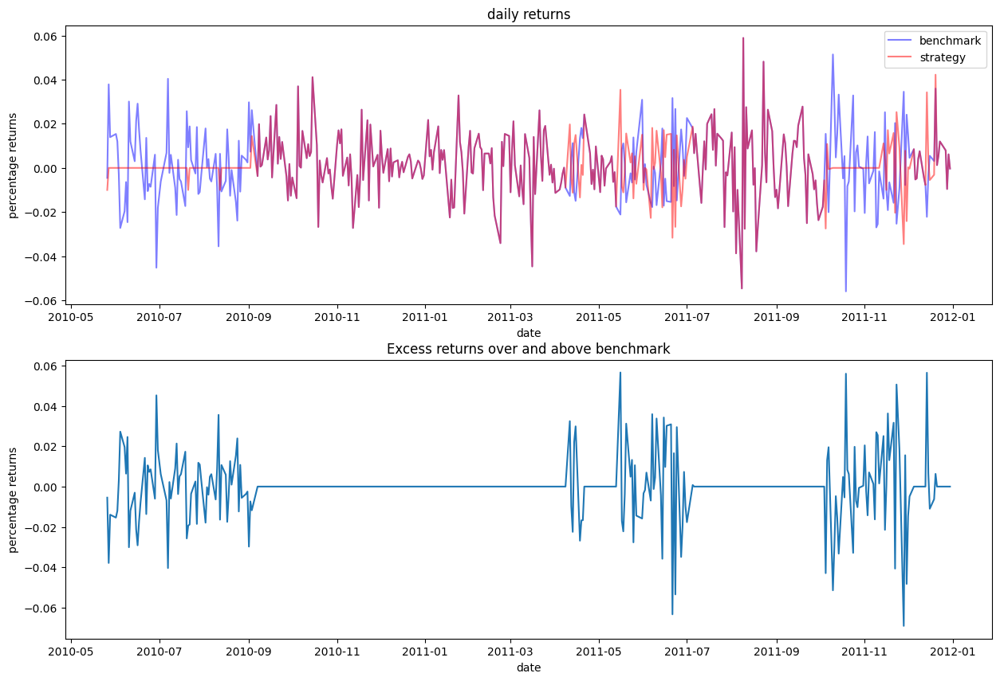

In [465]:
plot_returns_comp(ret)

In [466]:
def cumret(returns):
  return (returns+1).cumprod()

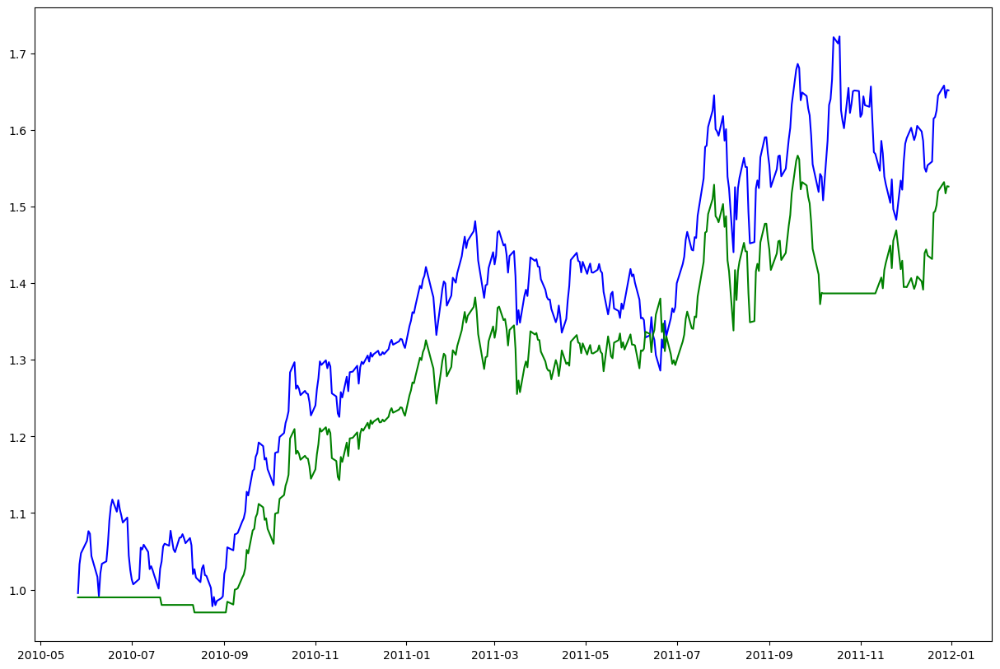

In [467]:
plt.figure(figsize=(15,10))
plt.plot(cumret(ret['returns']),c='blue')
plt.plot(cumret(ret['strat_returns']),c='green')
plt.show()

Below function gives us the drawdown and distribution plot for the returns of our bench mark and strategy on the asset

In [468]:
def sortino_ratio(series):
    # consider only returns less than 0
    downside = series.copy()
    downside[downside > 0] = 0
    return (series.mean())/downside.std(ddof=0)

def sharpe_ratio(series):
    return (series.mean()) / series.std(ddof=0)


In [469]:
import scipy.stats as stats

In [470]:
def statistics(df,get_plots=False,leverage=1):
  if isinstance(df, pd.DataFrame):
    """
    Calculates the drawdowns given a column of daily returns.
    Returns a pandas DataFrame with columns for daily returns,
    cumulative returns, and drawdowns.
    """
    # Calculate cumulative returns
    cum_returns = (1 + df.returns).cumprod()
    cum_returns_strat = (1 + df.strat_returns * leverage).cumprod()
    # Calculate the previous peaks
    previous_peaks = cum_returns.cummax()
    previous_peaks_strat = cum_returns_strat.cummax()

    # Calculate the drawdowns
    drawdowns = (cum_returns - previous_peaks) / previous_peaks
    drawdowns_strat = (cum_returns_strat - previous_peaks_strat) / previous_peaks_strat

    # Calculate the statistics of the drawdowns
    max_strat_drawdown = -drawdowns_strat.min()
    max_drawdown = -drawdowns.min()
    kurtosis = stats.kurtosis(-drawdowns)
    strat_kurtosis = stats.kurtosis(-drawdowns_strat)

    skewness = stats.skew(-drawdowns)
    strat_skewness = stats.skew(-drawdowns_strat)

    # Create a DataFrame with the results
    results = pd.DataFrame({'Cumulative Returns': cum_returns,
                            'Strategy Cumulative Returns': cum_returns_strat,
                            'Drawdowns': drawdowns,
                            'Strategy Drawdowns': drawdowns_strat})
    trade_stats={}
    trade_stats['mean_returns']={'benchmark':df.returns.mean(),'strategy':df.strat_returns.mean()}
    trade_stats['cummulative_returns']={'benchmark':cum_returns[-1],'strategy':cum_returns_strat[-1]}
    trade_stats['sharpe_ratio']={'benchmark':sharpe_ratio(df.returns),'strategy':sharpe_ratio(df.strat_returns)}
    trade_stats['sortino_ratio']={'benchmark':sortino_ratio(df.returns),'strategy':sortino_ratio(df.strat_returns)}
    trade_stats['max_drawdown']={'benchmark':max_drawdown,'strategy':max_strat_drawdown}
    trade_stats['drawdowns_kurtosis']={'benchmark':kurtosis,'strategy':strat_kurtosis}
    trade_stats['drawdowns_skewness']={'benchmark':skewness,'strategy':strat_skewness}

    if get_plots==False:
      return results,trade_stats
    fig,axs = plt.subplots(2,figsize=(15,15))
    axs[0].plot(results.iloc[:,:2],label=results.columns[:2])
    axs[0].set_title('cummulative returns')
    axs[0].set_ylabel('Returns')
    axs[0].set_xlabel('date')
    axs[0].legend()
    axs[1].plot(results.iloc[:,2:],label=results.columns[2:])
    axs[1].set_title('drawdown')
    axs[1].set_ylabel('drawdown')
    axs[1].set_xlabel('date')
    axs[1].legend()
    plt.show()
    return results,trade_stats
  else:
    print('invalid Datatype')
    return None



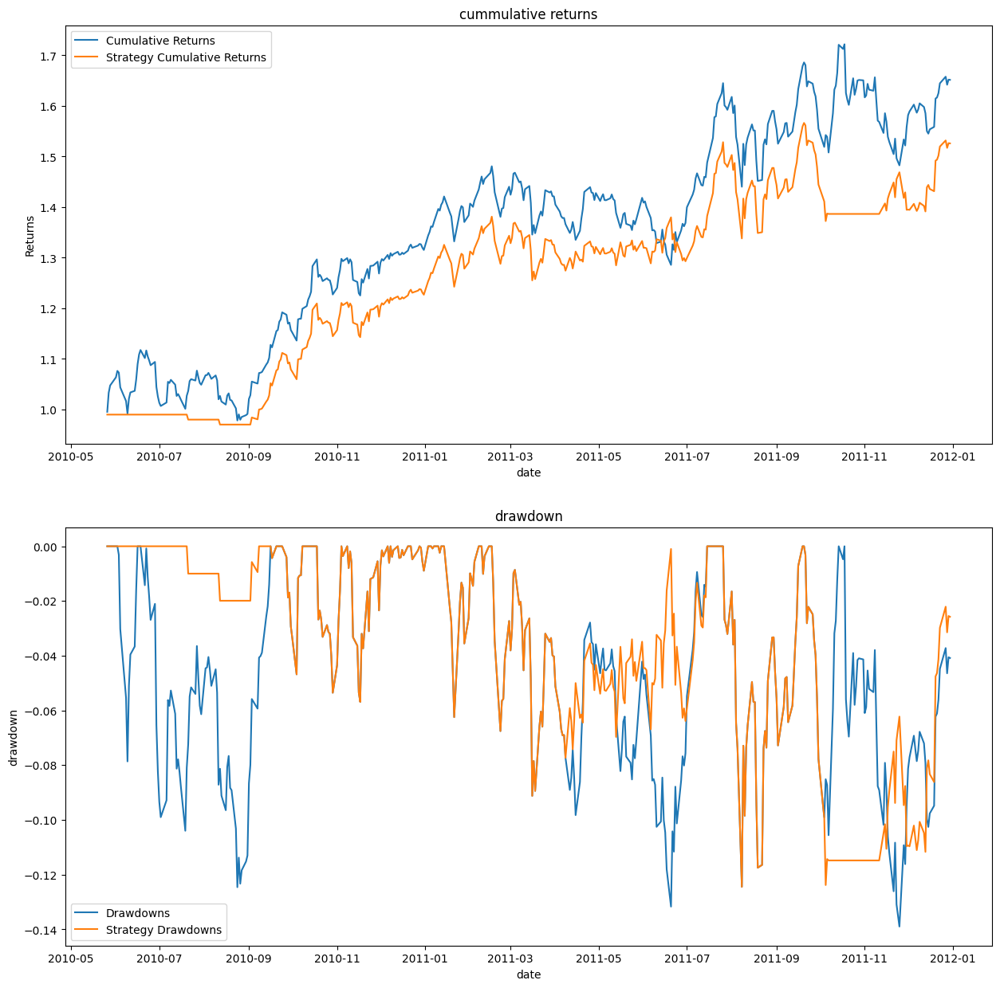

In [471]:
_,trade_stats=statistics(ret,True)

In [472]:
pd.DataFrame(trade_stats)

,mean_returns,cummulative_returns,sharpe_ratio,sortino_ratio,max_drawdown,drawdowns_kurtosis,drawdowns_skewness
benchmark,0.001363,1.651578,0.086668,0.153002,0.138949,-0.792210,0.369838
strategy,0.001130,1.526054,0.086244,0.143709,0.124439,-0.322205,0.863084


In [473]:
def run_backtest(symbol,lookback,start,end,print_trades=False,stoploss_pct=None,vol_type=None,vol_lookback=None,vol_multiplier=1,leverage=1,display_trades=False,show_plots=False,print_stats=False):
    ret,trades=VWAP_crossover(symbol,lookback,start,end,print_trades,stoploss_pct,vol_type,vol_lookback,vol_multiplier)
    trade_df=Process_trades(trades)
    if display_trades:
        print(trade_df)
        plot_trades(ret,trade_df,['RollingVWAP'])
        if vol_type!=None:
            plot_trades(ret,trade_df,['RollingVWAP','upper_band','lower_band'])
    get_plots=False
    if show_plots:
        plot_returns_comp(ret)
        get_plots=True
        
    _,trade_stats=statistics(ret,get_plots,leverage)
    if print_stats:
        print(trade_stats)
    return trade_stats,trade_df,ret
        

[*********************100%***********************]  1 of 1 completed
   direction entry date  entry price  stop loss  exit date  exit price  \
1       long 2010-05-26     8.931429   8.842115 2010-05-26    8.842115   
2       long 2010-07-21     9.467500   9.372825 2010-07-21    9.372825   
1      short 2010-08-12     8.810357   8.898461 2010-08-12    8.898461   
3       long 2010-09-03     9.110357   9.019254 2011-04-11   11.930714   
2      short 2011-04-11    11.930714  12.050021 2011-04-19   12.050021   
4       long 2011-04-20    12.268214  12.145532 2011-05-16   12.114286   
3      short 2011-05-16    12.114286  12.235429 2011-05-31   12.235429   
5       long 2011-06-01    12.459643  12.335047 2011-06-01   12.335047   
4      short 2011-06-03    12.256429  12.378993 2011-06-06   12.346429   
5      short 2011-06-07    12.077500  12.198275 2011-07-01   12.198275   
6       long 2011-07-05    12.250000  12.127500 2011-10-05   13.137857   
7       long 2011-10-06    13.333214  13.19

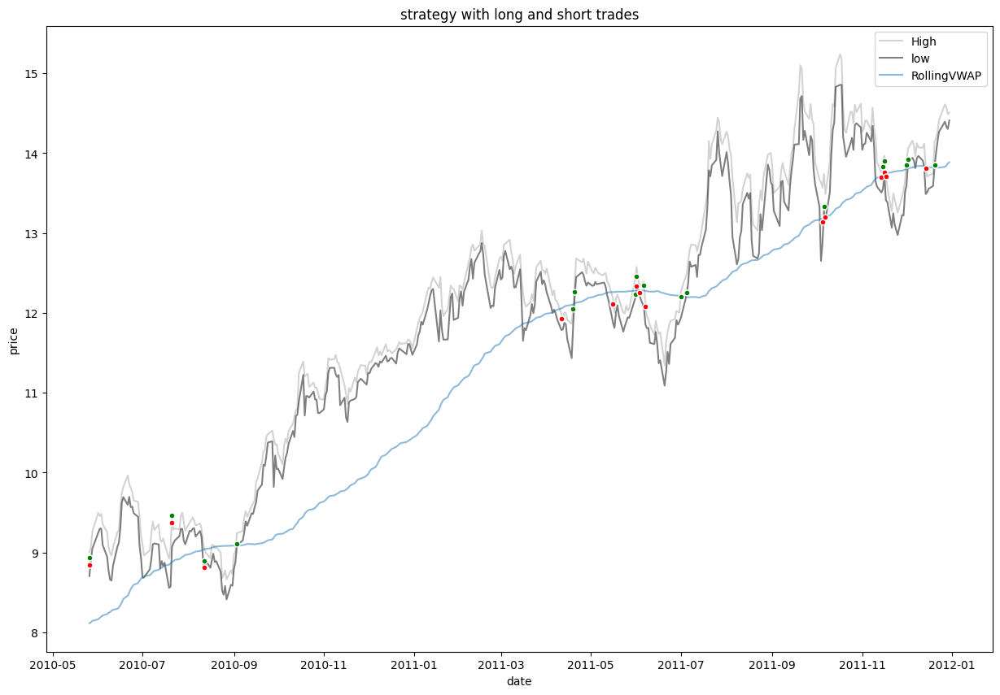

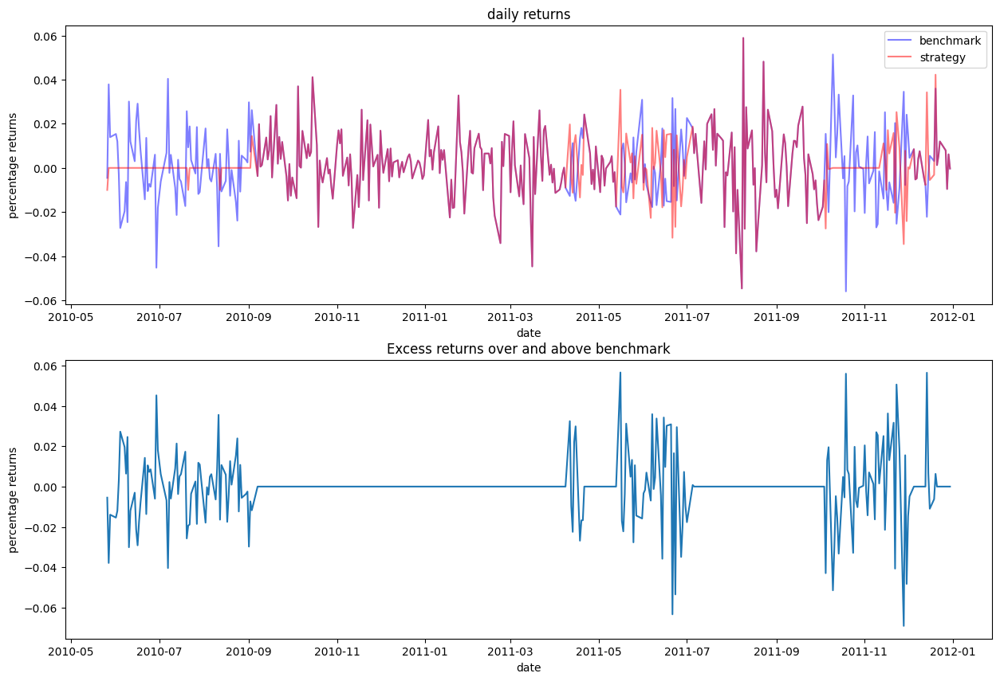

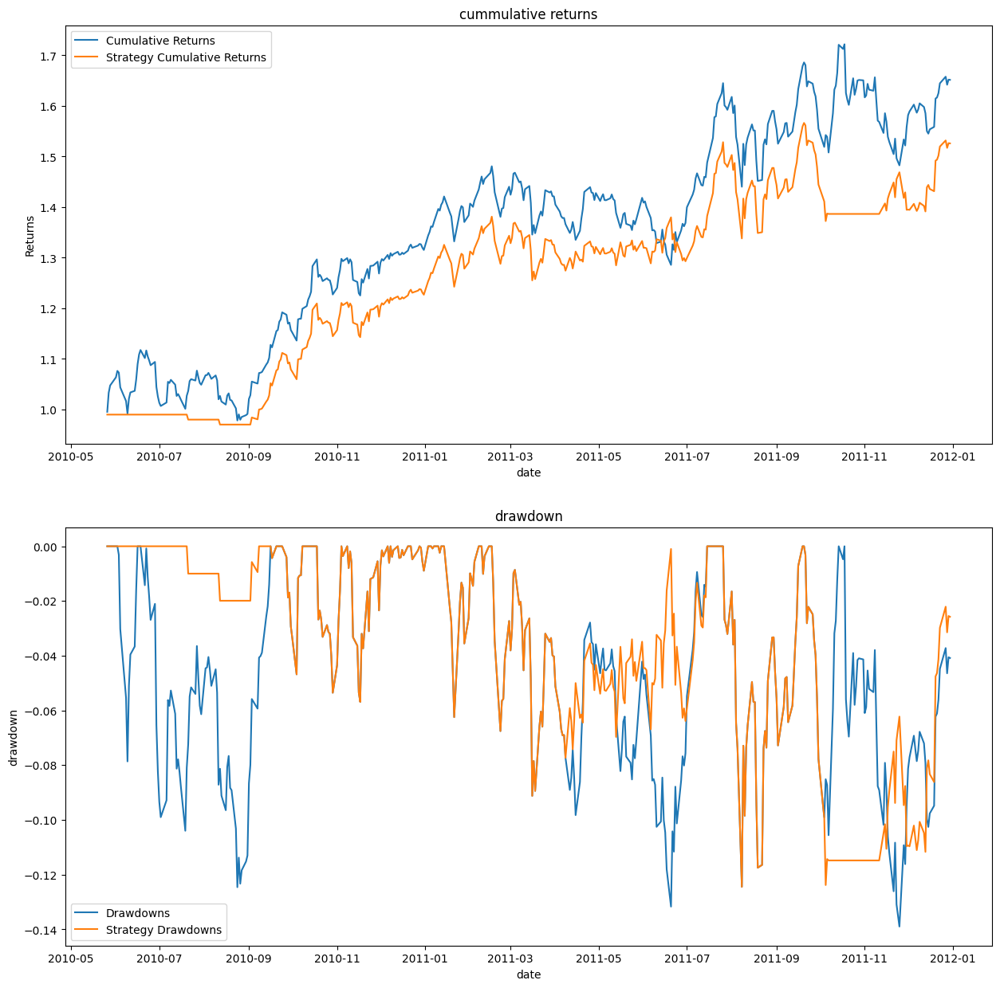

{'mean_returns': {'benchmark': 0.001363217989740627, 'strategy': 0.0011299893374964768}, 'cummulative_returns': {'benchmark': 1.6515781563426317, 'strategy': 1.526053956578988}, 'sharpe_ratio': {'benchmark': 0.08666778052719265, 'strategy': 0.08624382117342308}, 'sortino_ratio': {'benchmark': 0.15300197762944945, 'strategy': 0.14370944368549707}, 'max_drawdown': {'benchmark': 0.1389493999883382, 'strategy': 0.1244391557783198}, 'drawdowns_kurtosis': {'benchmark': -0.7922096791933773, 'strategy': -0.3222049230184245}, 'drawdowns_skewness': {'benchmark': 0.3698382843183357, 'strategy': 0.8630840021681545}}


({'mean_returns': {'benchmark': 0.001363217989740627,
   'strategy': 0.0011299893374964768},
  'cummulative_returns': {'benchmark': 1.6515781563426317,
   'strategy': 1.526053956578988},
  'sharpe_ratio': {'benchmark': 0.08666778052719265,
   'strategy': 0.08624382117342308},
  'sortino_ratio': {'benchmark': 0.15300197762944945,
   'strategy': 0.14370944368549707},
  'max_drawdown': {'benchmark': 0.1389493999883382,
   'strategy': 0.1244391557783198},
  'drawdowns_kurtosis': {'benchmark': -0.7922096791933773,
   'strategy': -0.3222049230184245},
  'drawdowns_skewness': {'benchmark': 0.3698382843183357,
   'strategy': 0.8630840021681545}},
    direction entry date  entry price  stop loss  exit date  exit price  \
 1       long 2010-05-26     8.931429   8.842115 2010-05-26    8.842115   
 2       long 2010-07-21     9.467500   9.372825 2010-07-21    9.372825   
 1      short 2010-08-12     8.810357   8.898461 2010-08-12    8.898461   
 3       long 2010-09-03     9.110357   9.019254 2011

In [474]:
run_backtest('aapl',100,start='2010-01-01',end='2012-01-01',stoploss_pct=1,display_trades=True,show_plots=True,print_stats=True)

# Parameter Optimisation (time based visualised with just AAPL)

In [475]:

VWAP_fixedstop_strategy_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_fixedstop_strategy_statistics.keys():
  VWAP_fixedstop_strategy_statistics[sector]={}
  for stock in eval(sector+'_stocks'):
    print(stock)
    VWAP_fixedstop_strategy_statistics[sector][stock]={}
    for lookback in strat_lookbacks:
      VWAP_fixedstop_strategy_statistics[sector][stock][lookback]={}
      for stoploss in fixed_stoplosses:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,stoploss_pct=stoploss)
        VWAP_fixedstop_strategy_statistics[sector][stock][lookback][stoploss]=trade_stats


AAPL
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***

In [476]:
import datetime as dt

In [477]:
from dateutil.rrule import rrule, YEARLY
from datetime import datetime

start_date = datetime.strptime('1999-01-01', '%Y-%m-%d')
end_date = datetime.strptime('2023-01-01', '%Y-%m-%d')

intervals = list(rrule(YEARLY, interval=2, dtstart=start_date, until=end_date))
intervals = [interval.strftime('%Y-%m-%d') for interval in intervals ]

In [478]:
stock='AAPL'
VWAP_fixedstop_strategy_time_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_fixedstop_strategy_time_statistics.keys():
  VWAP_fixedstop_strategy_time_statistics[sector]={}
  for i,date in enumerate(intervals[:-1]):
    start = intervals[i]
    end = intervals[i+1]
    VWAP_fixedstop_strategy_time_statistics[sector][date]={}
    for lookback in strat_lookbacks:
      VWAP_fixedstop_strategy_time_statistics[sector][date][lookback]={}
      for stoploss in fixed_stoplosses:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,stoploss_pct=stoploss)
        VWAP_fixedstop_strategy_time_statistics[sector][date][lookback][stoploss]=trade_stats

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [479]:
new_dict=VWAP_fixedstop_strategy_statistics['Tech']['AAPL']

In [480]:
def df_prep(new_dict,variable):
  '''for variable enter stoploss for fixes stoplosses,
  garch_vol_lookback for garch volatility trailing SL,
  hist_vol_lookback for Historical volatility trailing SL.'''
  # Flatten the dictionary
  flat_dict = {(k1, k2, k3, k4): v 
              for k1, v1 in new_dict.items()
              for k2, v2 in v1.items()
              for k3, v3 in v2.items()
              for k4, v in v3.items()}

  # Convert the flattened dictionary to a DataFrame
  df = pd.DataFrame(flat_dict, index=[0])

  # Transpose the DataFrame so that each row corresponds to a key
  df = df.T.reset_index()

  # Rename the columns
  df.columns = ['lookback', variable, 'parameter', 'item', 'value']

  return df

In [481]:
df=df_prep(new_dict,'Stoploss')

In [482]:
df

,lookback,Stoploss,parameter,item,value
0,9,NaN,mean_returns,benchmark,0.001846
1,9,NaN,mean_returns,strategy,0.002088
2,9,NaN,cummulative_returns,benchmark,6.438433
3,9,NaN,cummulative_returns,strategy,8.761364
4,9,NaN,sharpe_ratio,benchmark,0.069206
...,...,...,...,...,...
779,200,5.0,max_drawdown,strategy,0.437163
780,200,5.0,drawdowns_kurtosis,benchmark,-0.448577
781,200,5.0,drawdowns_kurtosis,strategy,-0.518395
782,200,5.0,drawdowns_skewness,benchmark,0.804218


In [483]:
import seaborn as sns

In [484]:
def heat_map_plotter(df,variable):
  # Filter rows where 'item' is 'strategy'
  df_strategy = df[df['item'] == 'strategy']
  df_benchmark = df[df['item'] == 'benchmark']

  # Get unique parameters
  parameters = df_strategy['parameter'].unique()
  # For each parameter
  for parameter in parameters:
      # Filter rows for this parameter
      df_parameter = df_strategy[df_strategy['parameter'] == parameter]
      benchmark = df_benchmark[df_benchmark['parameter'] == parameter].iloc[0,-1]
    
      # Reshape the DataFrame
      df_pivot = df_parameter.pivot(index='lookback', columns=variable, values='value')

      # Create the heatmap
      plt.figure(figsize=(10, 8))
      sns.heatmap(df_pivot, annot=True, fmt=".4f", cmap='coolwarm')
      plt.title(f'{parameter} for Strategy (benchmark value = {benchmark:.4f})')
      plt.show()

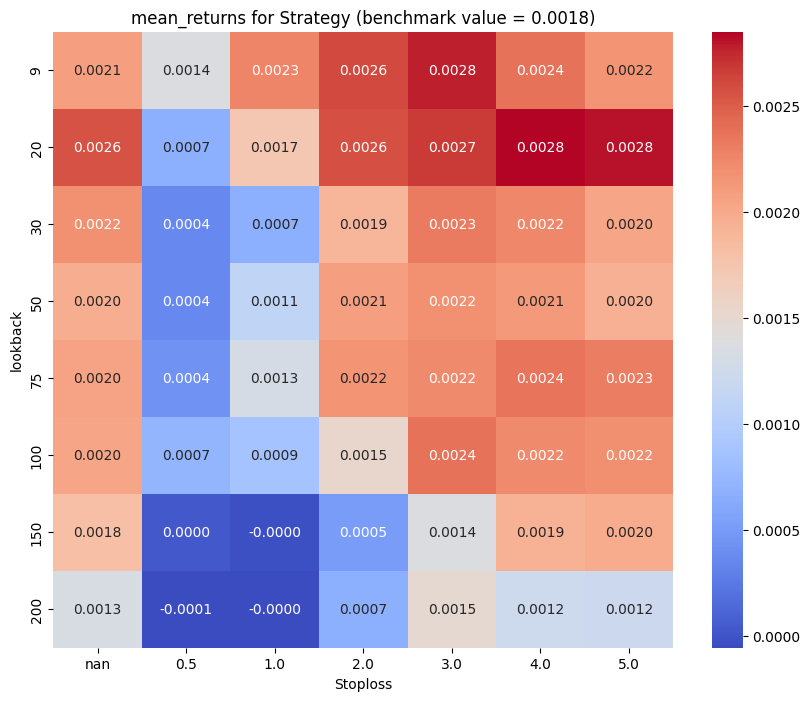

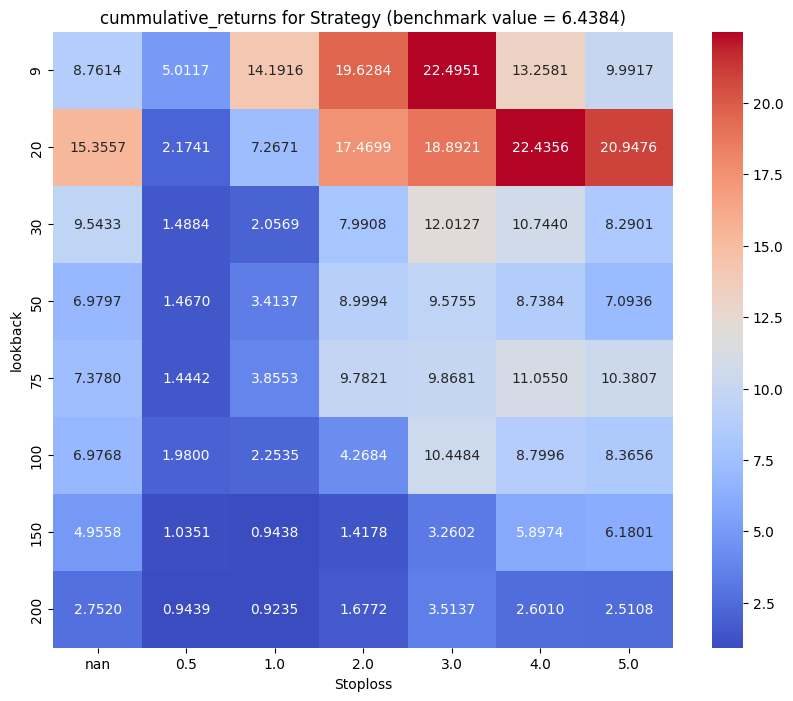

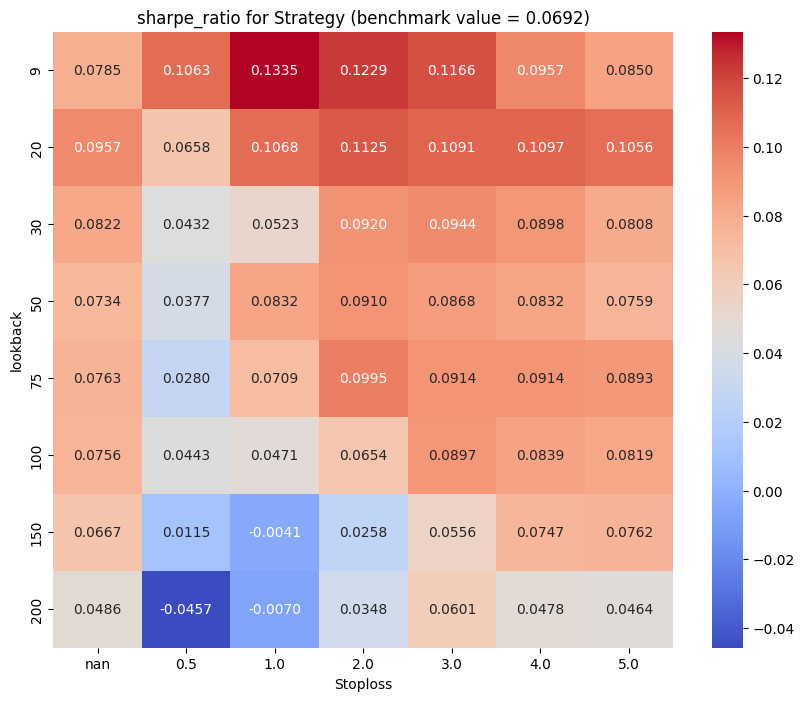

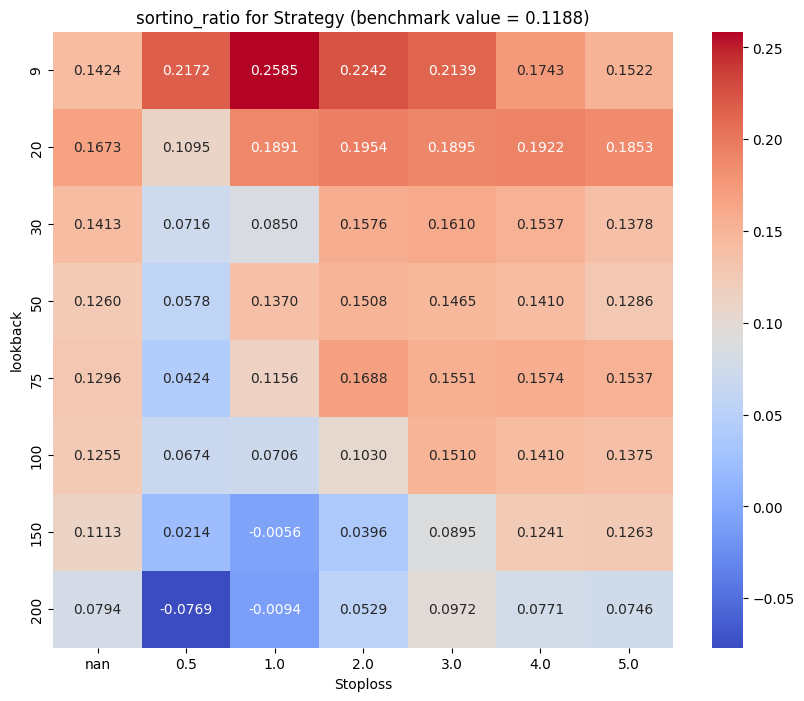

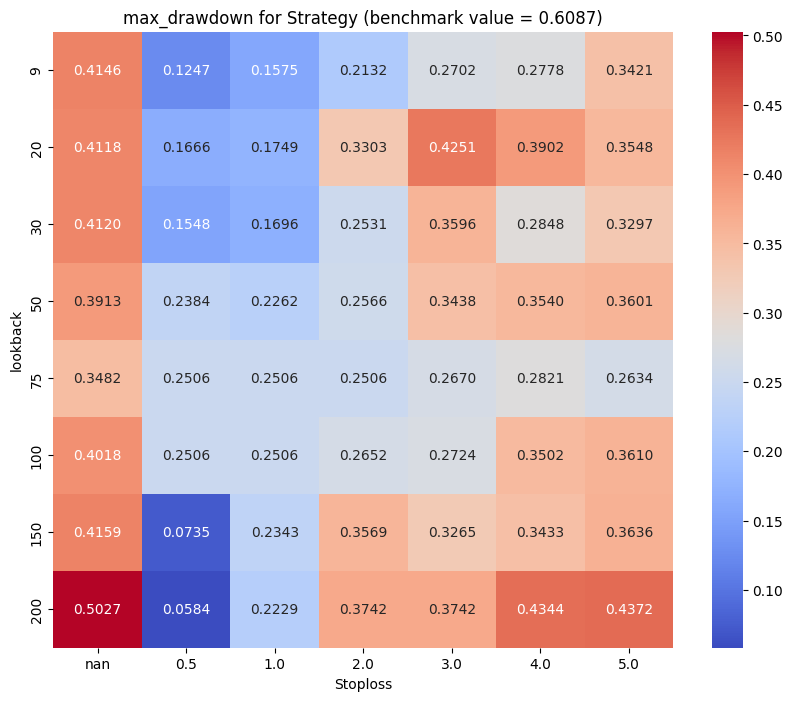

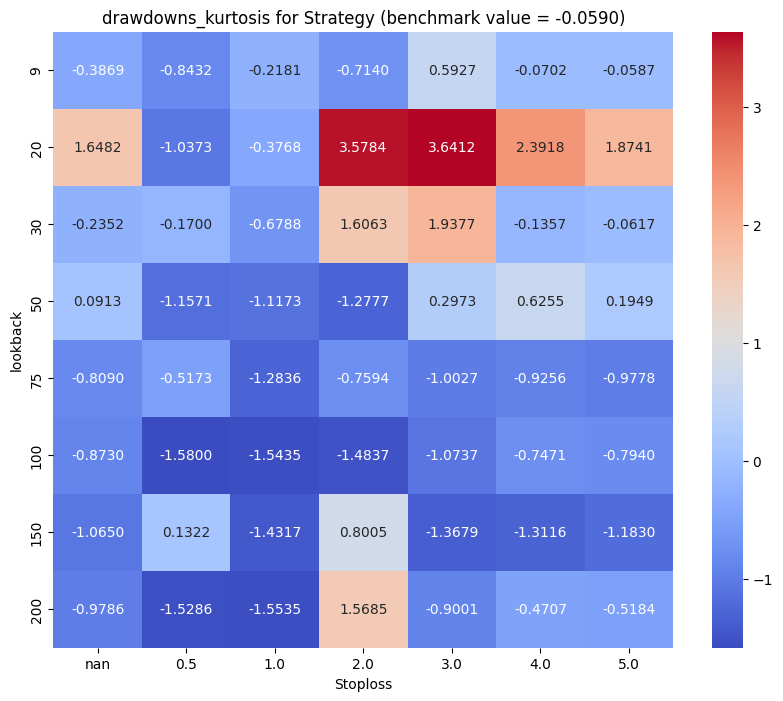

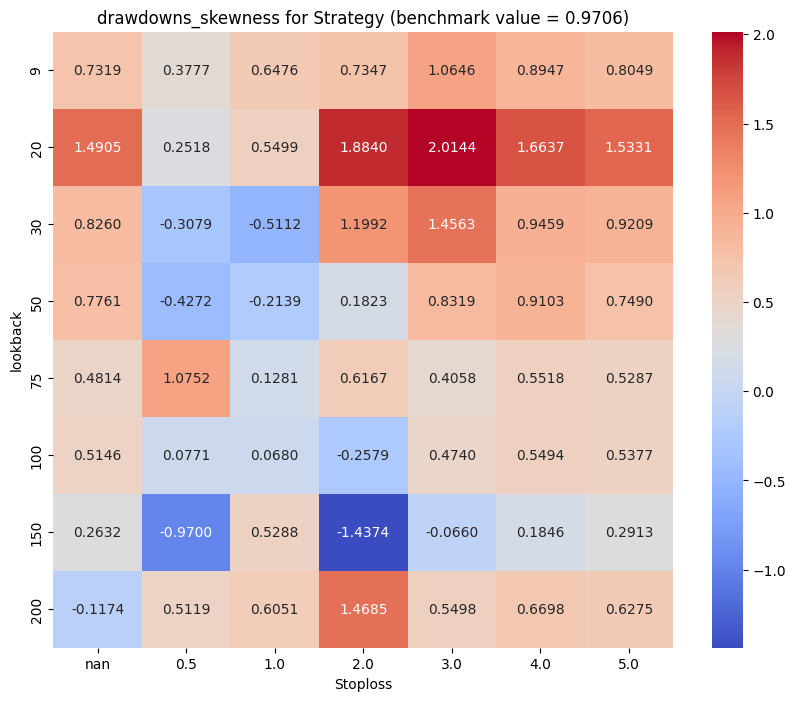

In [485]:
heat_map_plotter(df,'Stoploss')

*  looking at the above heat mps we can pick the right combination based on our requirement we can also run this for more combinations and decide on which is the optimum value.
*   For leveraged futures trading we can pick out parameters with lower drawdowns and more positive skewness along with more negative kurtosis. 
*   Negative kurtosis means thinner tails so lesser high drawdown trades.
*   While directly trading the underlying we can maximise cummulative returns/mean_returns.

In [486]:
from sklearn.preprocessing import MinMaxScaler

def best_parameter(df,stock,weights='default',variable='Stoploss'):
  '''set weights for scoring in this order
  [max drawdown, drawdown skewness , drawdown kurtosis,sharpe_ratio,sortino_ratio]
   tip:- max drawdown and drawdown kurtosis must be negative for accurate results '''
  # Filter rows where 'item' is 'strategy'
  df_strategy = df[df['item'] == 'strategy']
  df_benchmark = df[df['item'] == 'benchmark']
  # Pivot the DataFrame
  df_pivot = df_strategy.pivot_table(index=['lookback', variable], columns='parameter', values='value')
  b_pivot = df_benchmark.pivot_table(index=['lookback', variable], columns='parameter', values='value')
  # Reset index to make 'lookback' and variable regular columns
  df_pivot.reset_index(inplace=True)

  parameters = ['max_drawdown', 'mean_returns', 'cummulative_returns', 'drawdowns_skewness', 'drawdowns_kurtosis','sharpe_ratio','sortino_ratio']

  # subtract the benchmark values from the table to calculate the score
  for parameter in parameters:
    df_pivot[parameter]=df_pivot[parameter]-b_pivot[parameter].values[0]

  scaler = MinMaxScaler()
  df_pivot[parameters] = scaler.fit_transform(df_pivot[parameters])


  # Calculate the score for each row
  # weigted scoring for returns - no weigthting for returns weighting of 3 for skewness and kurtosis and 10 for max drawdown.
  # scoring is negative for  max drawdown and skewness as we want to reduce these values and it is positive for rest 
  if weights=='default':
    W = [-1,1,-1,1,1]
  elif len(weights)==5:
    W=weights
  else:
    print('invalid weights')
    W = [-1,1,-1,1,1]
  df_pivot['score'] = (W[0]*df_pivot['max_drawdown'] + W[1]*df_pivot['drawdowns_skewness'] + W[2]*df_pivot['drawdowns_kurtosis'] + W[3]*df_pivot['sharpe_ratio'] + W[4]*df_pivot['sortino_ratio'])
  sns.heatmap(df_pivot.pivot_table(index='lookback', columns=variable, values='score'), cmap='coolwarm')
  plt.title(f'score heatmap for {stock}')
  plt.show()

  # Find the row with the maximum score
  best_row = df_pivot[df_pivot['score'] == df_pivot['score'].max()]
  best_lookback = best_row['lookback'].values[0]
  best_stoploss = best_row[variable].values[0]
  # return the strategy and benchmark values for this paramaters 
  a = df_strategy[(df_strategy['lookback'] == best_lookback) & (df_strategy[variable] == best_stoploss)]
  b = df_benchmark[(df_benchmark['lookback'] == best_lookback) & (df_benchmark[variable] == best_stoploss)]
  a = a.pivot_table(index=['item','lookback', variable], columns='parameter', values='value')
  b = b.pivot_table(index=['item','lookback', variable], columns='parameter', values='value')
  a.reset_index(inplace=True)
  b.reset_index(inplace=True)
  final_df = pd.concat([a,b])
  #final_df['lookback']=[best_lookback,best_lookback]
  final_df.set_index('item',inplace=True)
  return final_df.to_dict('records')


In [487]:
# weights from chatgpt
weight=[-10,3,-5,5,5]

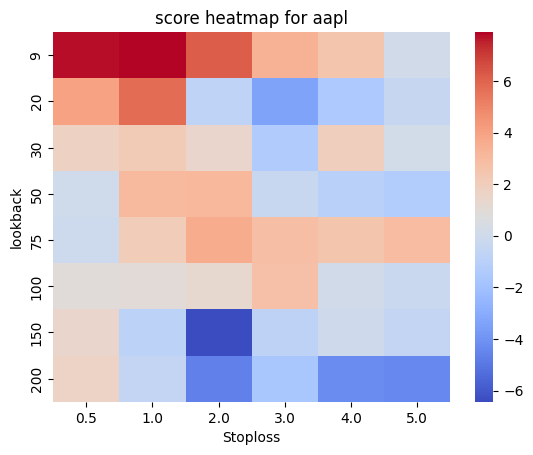

[{'lookback': 9,
  'Stoploss': 1.0,
  'cummulative_returns': 14.191559820299728,
  'drawdowns_kurtosis': -0.21806065904937366,
  'drawdowns_skewness': 0.6475540864519824,
  'max_drawdown': 0.15748739218901847,
  'mean_returns': 0.002264325486842214,
  'sharpe_ratio': 0.13347471641791347,
  'sortino_ratio': 0.2585461636209184},
 {'lookback': 9,
  'Stoploss': 1.0,
  'cummulative_returns': 6.438433125593358,
  'drawdowns_kurtosis': -0.059002707481658145,
  'drawdowns_skewness': 0.9706275098295523,
  'max_drawdown': 0.6086674116426719,
  'mean_returns': 0.00184577657488463,
  'sharpe_ratio': 0.06920606273058075,
  'sortino_ratio': 0.11875422635662045}]

In [488]:
best_parameter(df,'aapl',weight,'Stoploss')

In [489]:
def parameter_search(dictionary,stock,variable,weight):
  df=df_prep(dictionary,variable)
  return best_parameter(df,stock,weight,variable)


In [490]:
VWAP_fixedstop_strategy_statistics.keys()

dict_keys(['Tech'])

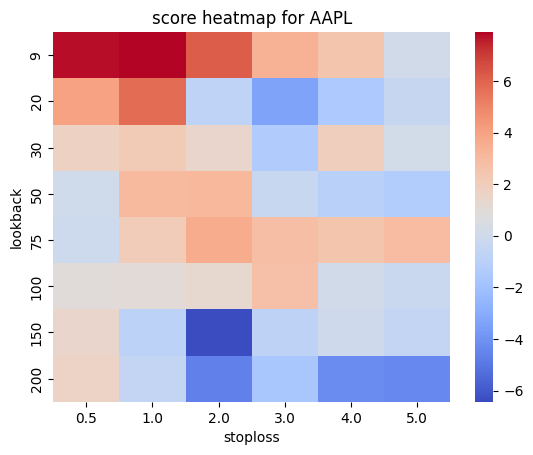

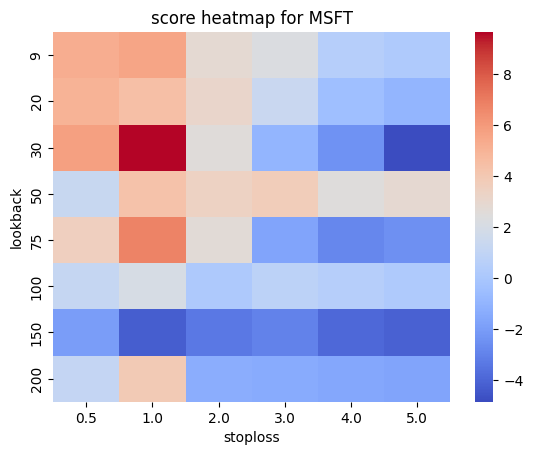

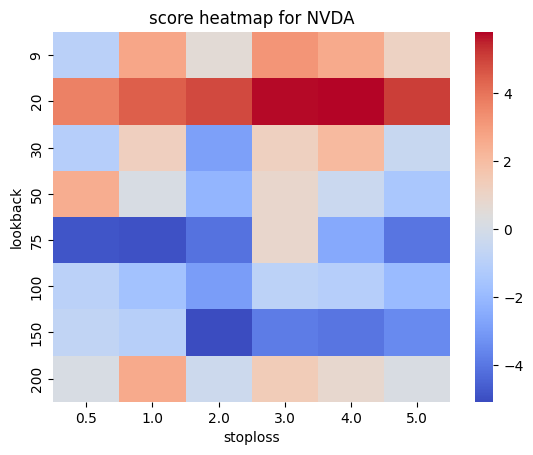

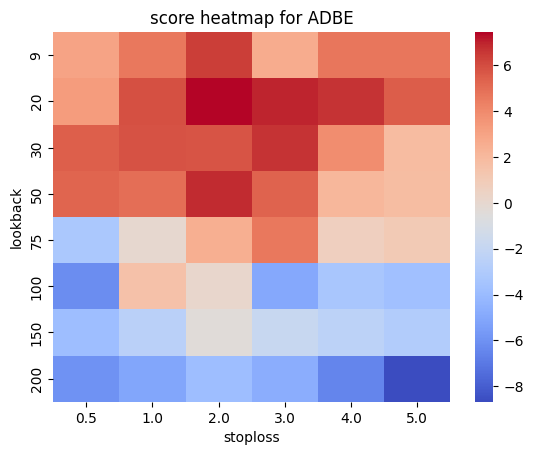

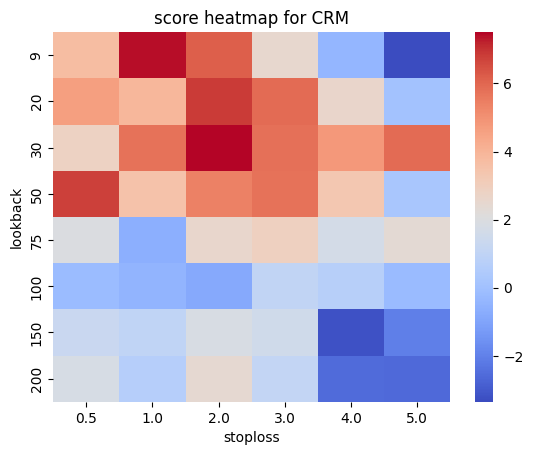

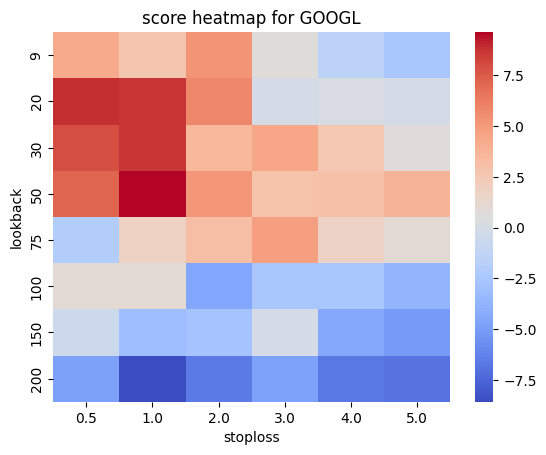

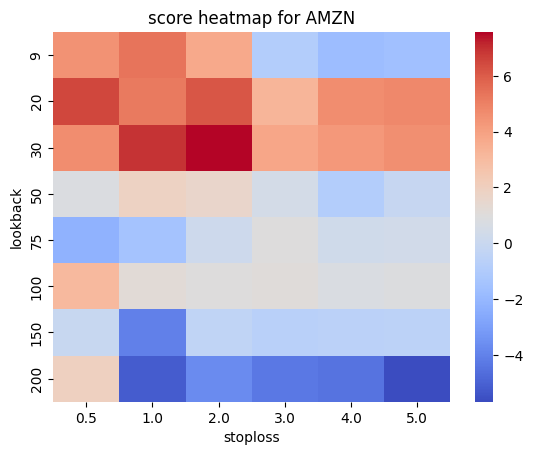

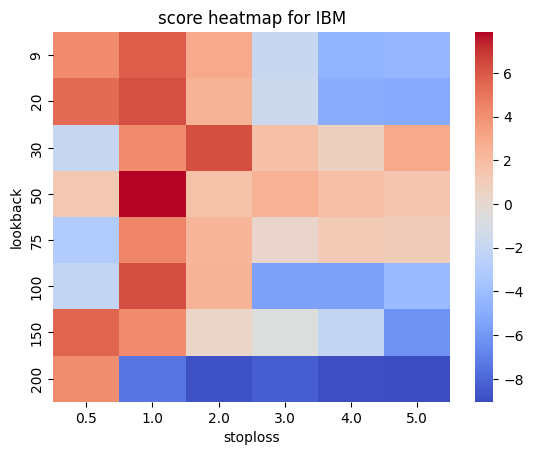

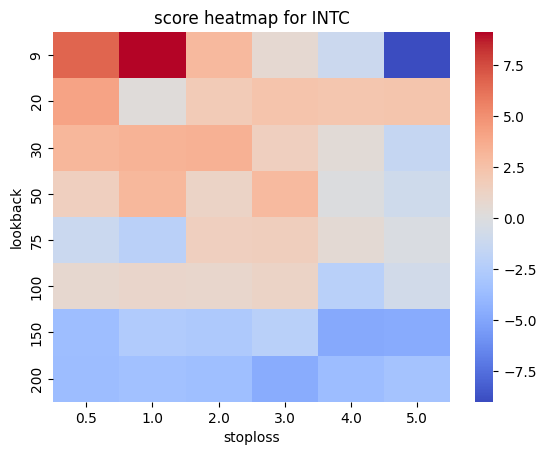

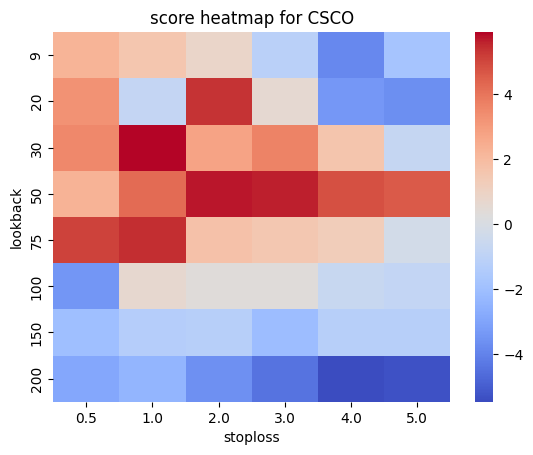

In [491]:
best_stop_params={}
for sector in VWAP_fixedstop_strategy_statistics.keys():
  best_stop_params[sector]={}
  a = VWAP_fixedstop_strategy_statistics[sector].keys()
  for stock in a:
    param_dict=parameter_search(VWAP_fixedstop_strategy_statistics[sector][stock],stock,'stoploss',weight)
    best_stop_params[sector][stock+' strategy']=param_dict[0]
    best_stop_params[sector][stock+' benchmark']=param_dict[1]
stop_params={}
for sector in VWAP_fixedstop_strategy_statistics.keys():
  stop_params[sector]=pd.DataFrame(best_stop_params[sector])



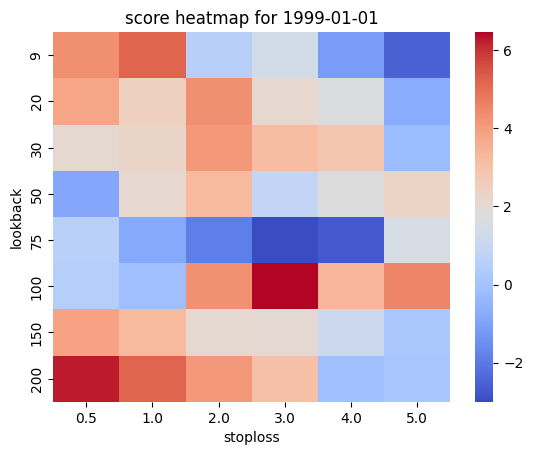

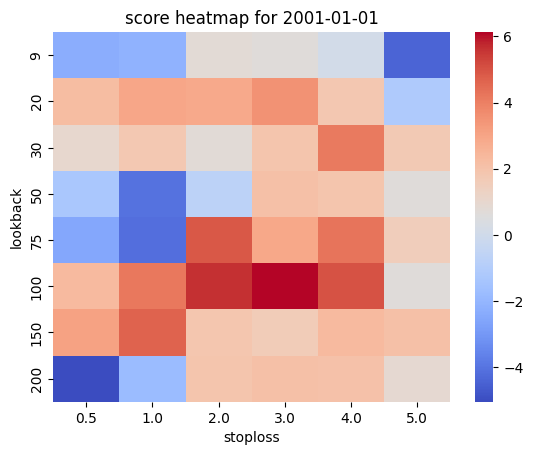

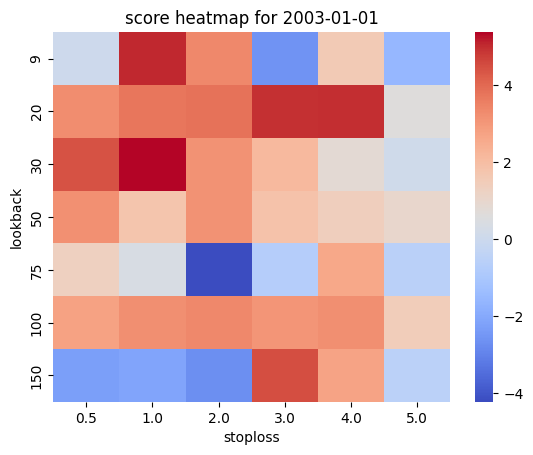

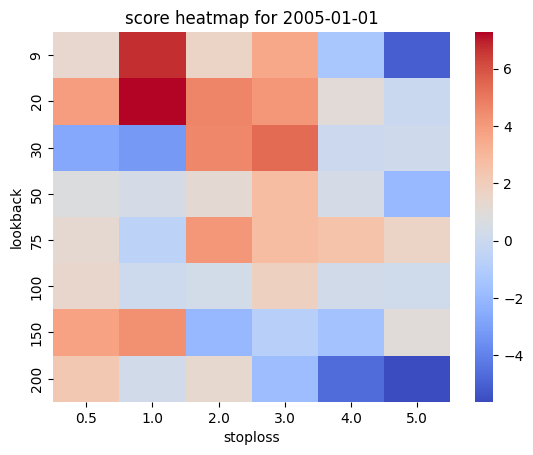

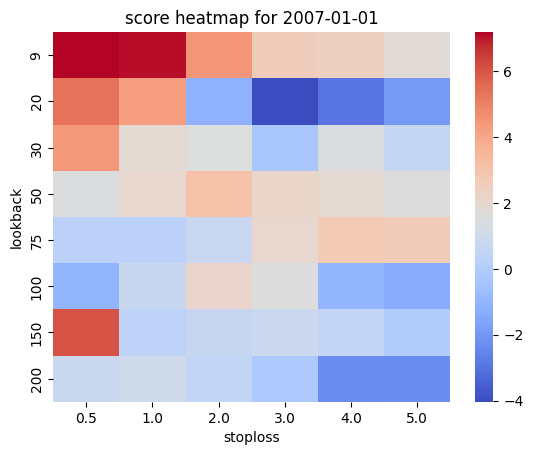

...

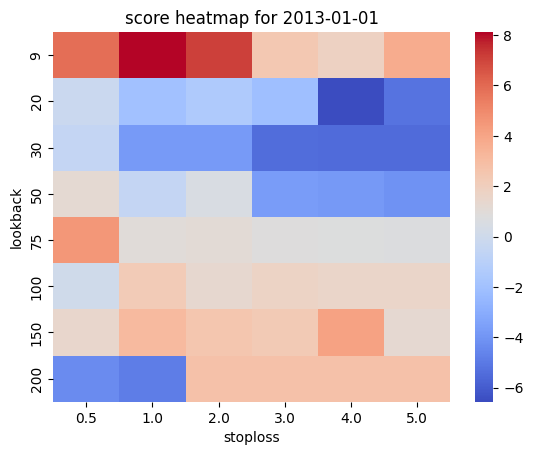

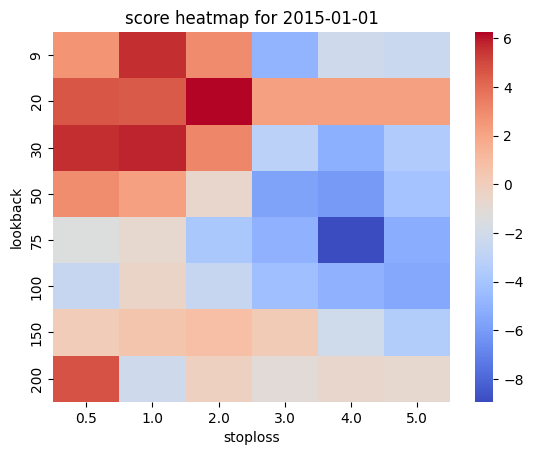

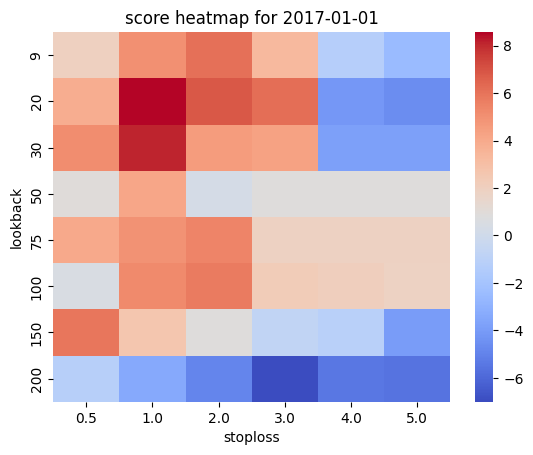

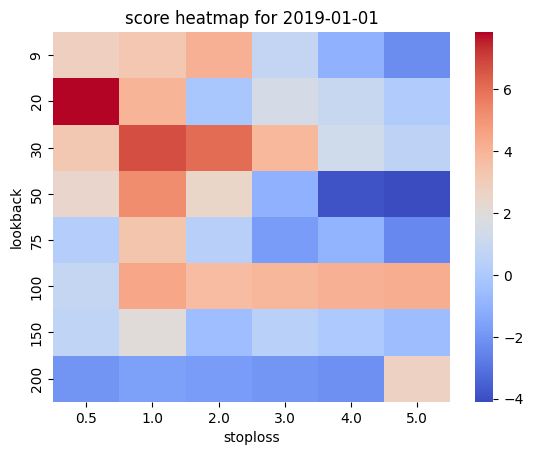

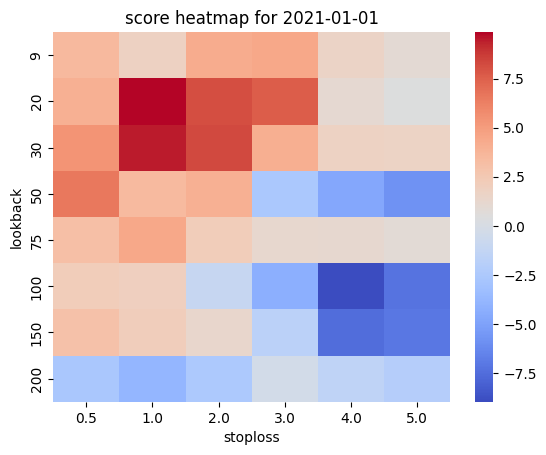

In [492]:
best_stop_params_time={}
for sector in VWAP_fixedstop_strategy_time_statistics.keys():
  best_stop_params_time[sector]={}
  a = VWAP_fixedstop_strategy_time_statistics[sector].keys()
  for date in a:
    param_dict=parameter_search(VWAP_fixedstop_strategy_time_statistics[sector][date],date,'stoploss',weight)
    best_stop_params_time[sector][date+' strategy']=param_dict[0]
    best_stop_params_time[sector][date+' benchmark']=param_dict[1]
stop_params_time={}
for sector in VWAP_fixedstop_strategy_time_statistics.keys():
  stop_params_time[sector]=pd.DataFrame(best_stop_params_time[sector])

In [493]:
def print_dataframe(data):
    if isinstance(data, dict):
        df = pd.DataFrame(data)
    elif isinstance(data, pd.DataFrame):
        df = data
    else:
        raise ValueError("Invalid data type. Expected dictionary or DataFrame.")

    styled_df = df.style.set_properties(**{'font-family': 'Arial', 'font-size': '12pt'}) \
                         .set_table_styles([{'selector': 'th', 'props': [('background-color', 'blue')]}])
    display(styled_df)

print_dataframe(best_stop_params['Tech'])
print_dataframe(best_stop_params_time['Tech'])

,AAPL strategy,AAPL benchmark,MSFT strategy,MSFT benchmark,NVDA strategy,NVDA benchmark,ADBE strategy,ADBE benchmark,CRM strategy,CRM benchmark,GOOGL strategy,GOOGL benchmark,AMZN strategy,AMZN benchmark,IBM strategy,IBM benchmark,INTC strategy,INTC benchmark,CSCO strategy,CSCO benchmark
lookback,9.000000,9.000000,30.000000,30.000000,20.000000,20.000000,20.000000,20.000000,30.000000,30.000000,50.000000,50.000000,30.000000,30.000000,50.000000,50.000000,9.000000,9.000000,30.000000,30.000000
stoploss,1.000000,1.000000,1.000000,1.000000,4.000000,4.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
cummulative_returns,14.191560,6.438433,4.109763,1.173662,88.821973,2.449300,10.879204,1.325883,12.150618,5.484758,6.805265,3.542945,12.373069,3.759642,2.450214,1.424374,5.577950,0.880829,1.913538,1.352542
drawdowns_kurtosis,-0.218061,-0.059003,-1.333270,-0.504950,-0.058014,-1.447908,0.577333,0.000126,-0.460038,-0.074093,-1.280761,-0.806127,-0.785949,-0.130683,-1.003567,1.024485,0.640371,-0.706032,-1.118544,-0.884261
drawdowns_skewness,0.647554,0.970628,0.235344,0.838819,0.834662,0.434327,0.910701,0.954209,0.594887,1.051646,-0.192580,0.652502,0.526852,0.621431,0.118046,1.205726,1.035679,0.096101,0.391844,0.635962
max_drawdown,0.157487,0.608667,0.129110,0.591203,0.231852,0.850784,0.203382,0.667083,0.232954,0.704958,0.151175,0.652948,0.170439,0.652549,0.130295,0.448154,0.170509,0.579241,0.154480,0.600352
mean_returns,0.002264,0.001846,0.001231,0.000328,0.004095,0.001385,0.002200,0.000548,0.002347,0.001930,0.001680,0.001311,0.002308,0.001567,0.000788,0.000416,0.001465,0.000138,0.000589,0.000468
sharpe_ratio,0.133475,0.069206,0.096163,0.016445,0.132141,0.038350,0.093769,0.021589,0.093144,0.058084,0.121934,0.056657,0.098489,0.049501,0.080681,0.026442,0.108362,0.006322,0.053154,0.022140
sortino_ratio,0.258546,0.118754,0.172393,0.027205,0.258564,0.062615,0.168147,0.036738,0.166044,0.107528,0.219652,0.098653,0.220636,0.091879,0.141630,0.043649,0.210929,0.010189,0.092881,0.037510


,1999-01-01 strategy,1999-01-01 benchmark,2001-01-01 strategy,2001-01-01 benchmark,2003-01-01 strategy,2003-01-01 benchmark,2005-01-01 strategy,2005-01-01 benchmark,2007-01-01 strategy,2007-01-01 benchmark,2009-01-01 strategy,2009-01-01 benchmark,2011-01-01 strategy,2011-01-01 benchmark,2013-01-01 strategy,2013-01-01 benchmark,2015-01-01 strategy,2015-01-01 benchmark,2017-01-01 strategy,2017-01-01 benchmark,2019-01-01 strategy,2019-01-01 benchmark,2021-01-01 strategy,2021-01-01 benchmark
lookback,100.000000,100.000000,100.000000,100.000000,30.000000,30.000000,20.000000,20.000000,9.000000,9.000000,150.000000,150.000000,20.000000,20.000000,9.000000,9.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
stoploss,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.500000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,0.500000,0.500000,1.000000,1.000000
cummulative_returns,4.337168,0.716867,1.616321,0.616876,3.134431,4.475335,2.056901,2.293594,2.853389,0.902029,1.311103,1.953607,2.740001,1.583368,2.141877,1.485028,2.010993,0.974096,1.896990,1.296884,1.756441,3.431342,1.731788,0.984616
drawdowns_kurtosis,-1.413619,0.237765,-0.805884,-1.479160,-0.880509,0.426052,-0.923069,-0.840830,-1.058529,-0.226252,14.793911,-0.370122,0.100215,1.941309,-0.652668,-0.320947,-0.696248,-0.998355,-0.503396,7.683708,-1.784389,0.918461,-0.866722,-0.675969
drawdowns_skewness,0.395514,1.223568,0.603280,0.004616,0.361788,0.910673,-0.338391,0.476510,-0.159098,1.020584,3.772769,0.835701,0.878550,1.391687,0.633399,0.839991,0.466334,-0.018784,0.765498,2.738836,0.096458,1.286557,0.456338,0.609611
max_drawdown,0.275936,0.805808,0.172407,0.479509,0.133973,0.206284,0.095056,0.407992,0.124654,0.597208,0.056870,0.129122,0.091880,0.274192,0.068017,0.240229,0.105423,0.320752,0.087395,0.367303,0.104942,0.314273,0.091756,0.307511
mean_returns,0.004299,0.000575,0.001513,-0.000669,0.002577,0.003461,0.001590,0.002007,0.002249,0.000275,0.000784,0.002025,0.002182,0.001107,0.001597,0.000926,0.001549,0.000064,0.001390,0.000655,0.001197,0.002819,0.001206,0.000153
sharpe_ratio,0.116927,0.011706,0.059860,-0.020575,0.138480,0.139819,0.112741,0.082940,0.135929,0.008880,0.122659,0.122178,0.159516,0.062654,0.145157,0.058152,0.105676,0.004190,0.123533,0.042873,0.137821,0.119470,0.101065,0.007943
sortino_ratio,0.212803,0.016726,0.109201,-0.033237,0.288322,0.289640,0.208340,0.156095,0.287100,0.014132,0.242361,0.220867,0.282955,0.111704,0.301386,0.090925,0.188761,0.006753,0.220775,0.070252,0.271230,0.200103,0.183875,0.013536


Based on these weights optimum parameters are 9 for lookback and 1 % for stoploss for AAPL

#initial strategy hypothesis tests 

In [494]:
def monte_carlo_from_trades(trade_df, num_simulations=1000, replace=False):
    # Initialize an empty list to hold the results of each simulation
    trade_df = trade_df.dropna(axis=0).copy()
    simulated_returns = []
    lowest_points = []

    plt.figure(figsize=(15,10))

    # Run the Monte Carlo simulation
    for _ in range(num_simulations):
        # Sample without replacement
        simulated = np.random.choice(trade_df['return'], size=len(trade_df['return']), replace=replace)
        # Calculate the cumulative return of the simulation
        cumulative_returns = (np.cumprod(simulated + 1))
        plt.plot(np.log(cumulative_returns), alpha=0.3)
        # Append the result to our list
        simulated_returns.append(cumulative_returns[-1])
        # Append the lowest point to our list
        lowest_points.append(cumulative_returns.min())
    plt.plot(np.log(np.cumprod(trade_df['return'].values + 1)),c='black',label='strategy')
    plt.title(f'mean of monte carlo {np.mean(simulated_returns)} and max_drawdown = {1-np.min(lowest_points)}')
    plt.xlabel('trades')
    plt.ylabel('log(cummulative returns)')
    plt.legend()
    plt.show()



In [495]:
def MC_sim(symbol,lookback,start,end,print_trades=False,stoploss_pct=None,vol_type=None,vol_lookback=None,vol_multiplier=1,leverage=1,display_trades=False,show_plots=False,print_stats=False,num_simulations=1000,replace=False):
    _,trade_df,_=run_backtest(symbol,lookback,start,end,print_trades,stoploss_pct,vol_type,vol_lookback,vol_multiplier,leverage,display_trades,show_plots,print_stats)
    monte_carlo_from_trades(trade_df,num_simulations,replace)

[*********************100%***********************]  1 of 1 completed


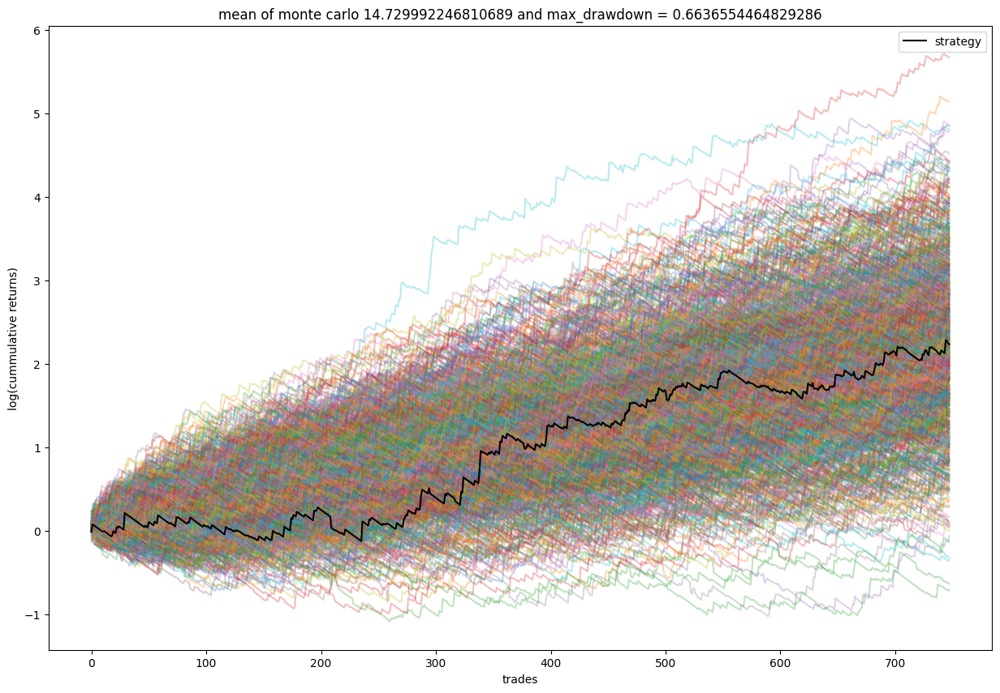

In [496]:
MC_sim('AAPL',9,'2000-01-01','2020-01-01',stoploss_pct=1,replace=True)

# Garch Volatility with multiplier of 1 

In [497]:
Garch_lookbacks = [22,126,252]

[*********************100%***********************]  1 of 1 completed
   direction entry date  entry price  stop loss  exit date  exit price  \
1       long 2010-04-16     8.877500   8.809903 2010-04-16    8.809903   
1      short 2010-05-20     8.638571   8.861032 2010-05-21    8.518892   
2       long 2010-05-24     8.831429   8.528954 2010-05-25    8.548214   
2      short 2010-05-25     8.548214   8.777034 2010-05-25    8.777034   
3       long 2010-05-27     8.950000   8.773941 2010-05-28    9.053612   
..       ...        ...          ...        ...        ...         ...   
41      long 2014-10-09    25.385000  25.028049 2014-10-13   25.049939   
34     short 2014-10-15    24.492500  24.794969 2014-10-16   24.190831   
42      long 2014-10-21    25.754999  25.372022 2014-10-21   25.372022   
35     short 2014-12-16    26.592501  26.978484 2014-12-16   26.978484   
43      long 2014-12-18    27.967501  27.521664 2014-12-31   27.991243   

      return  
1  -0.007614  
1   0.013854

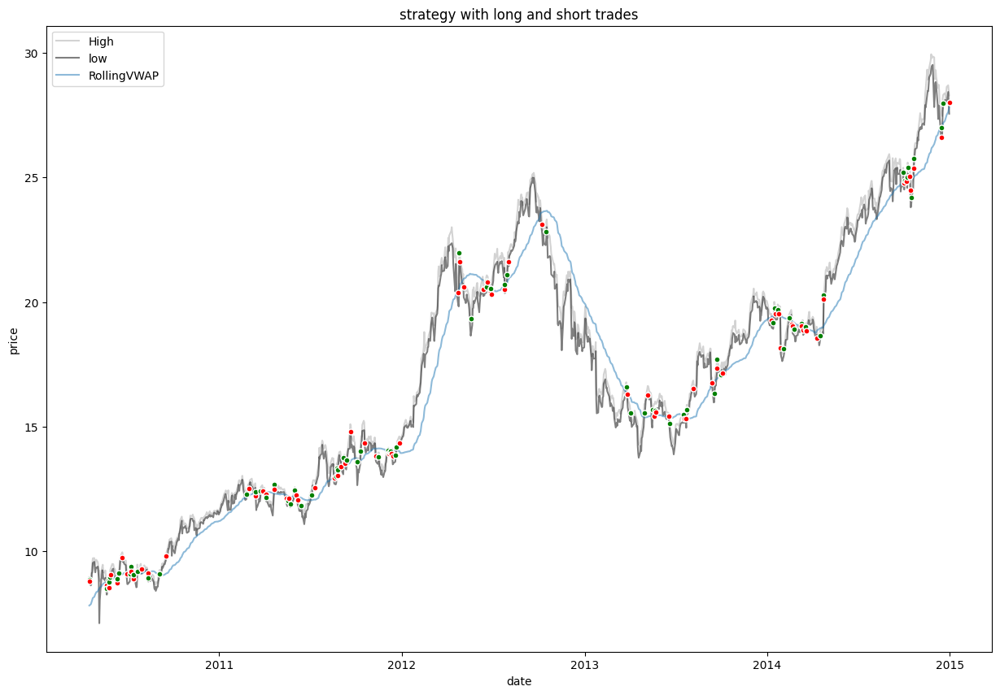

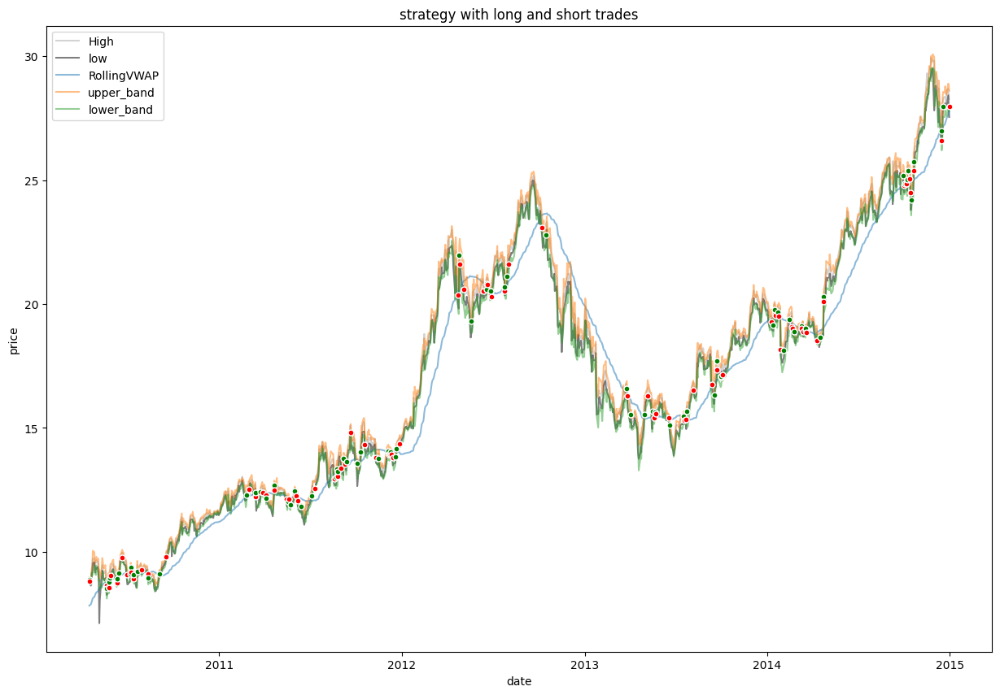

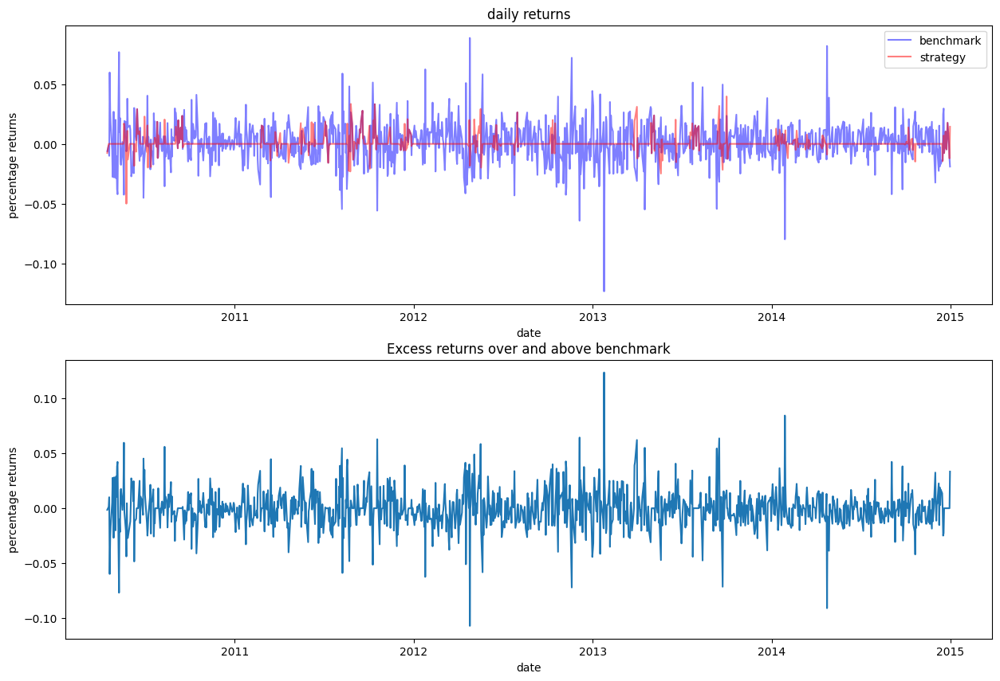

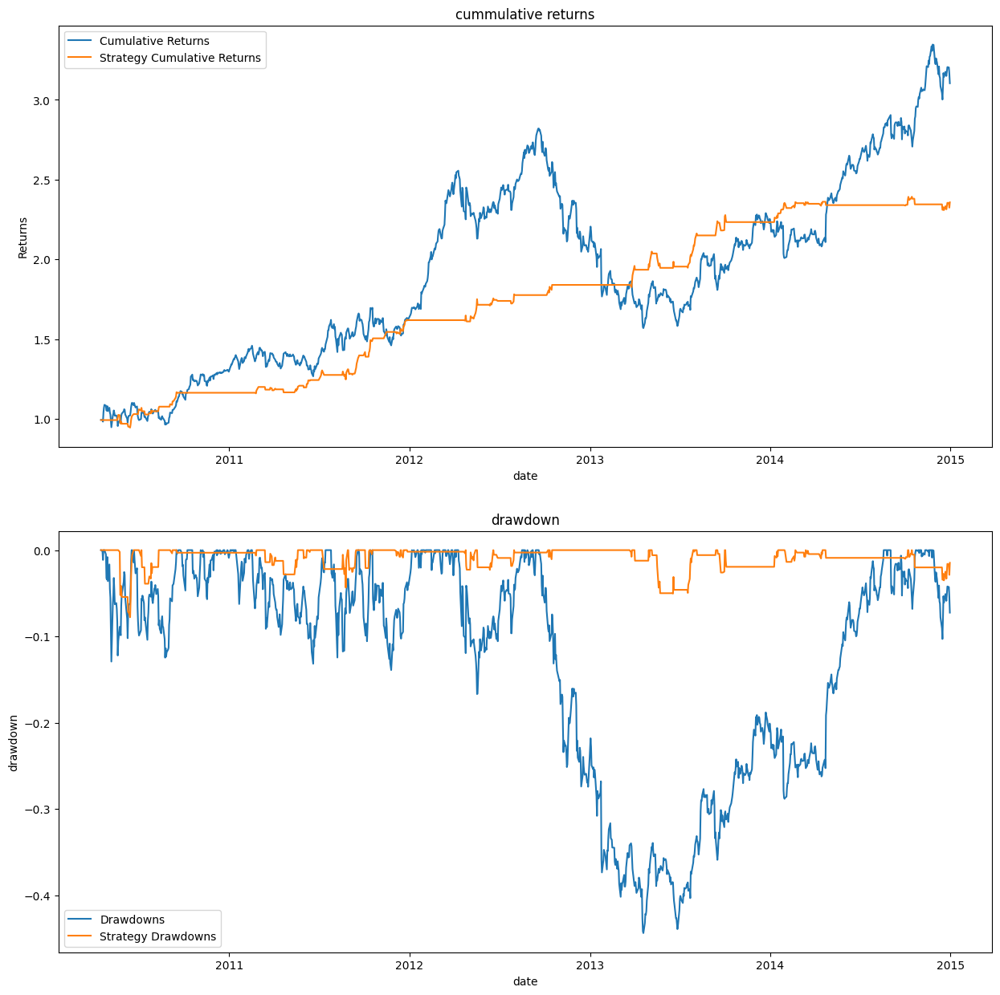

{'mean_returns': {'benchmark': 0.0010964710784700646, 'strategy': 0.000739165419145636}, 'cummulative_returns': {'benchmark': 3.104049296700081, 'strategy': 2.3576007059473394}, 'sharpe_ratio': {'benchmark': 0.06515922255578914, 'strategy': 0.12887351006438325}, 'sortino_ratio': {'benchmark': 0.11077403620950434, 'strategy': 0.24244273952482326}, 'max_drawdown': {'benchmark': 0.4437687017144149, 'strategy': 0.07774698259244951}, 'drawdowns_kurtosis': {'benchmark': -0.5563565860151307, 'strategy': 4.05147392384768}, 'drawdowns_skewness': {'benchmark': 0.8963168925155822, 'strategy': 1.914895780486559}}


In [498]:
_,garch_trades,_=run_backtest('AAPL',lookback=50,start='2010-01-01',end='2015-01-01',print_trades=False,stoploss_pct=None,vol_type='garch',vol_lookback=22,vol_multiplier=1,leverage=1,display_trades=True,show_plots=True,print_stats=True)

In [499]:
garch_trades

,direction,entry date,entry price,stop loss,exit date,exit price,return
1,long,2010-04-16,8.877500,8.809903,2010-04-16,8.809903,-0.007614
1,short,2010-05-20,8.638571,8.861032,2010-05-21,8.518892,0.013854
2,long,2010-05-24,8.831429,8.528954,2010-05-25,8.548214,-0.032069
2,short,2010-05-25,8.548214,8.777034,2010-05-25,8.777034,-0.026768
3,long,2010-05-27,8.950000,8.773941,2010-05-28,9.053612,0.011577
...,...,...,...,...,...,...,...
41,long,2014-10-09,25.385000,25.028049,2014-10-13,25.049939,-0.013199
34,short,2014-10-15,24.492500,24.794969,2014-10-16,24.190831,0.012317
42,long,2014-10-21,25.754999,25.372022,2014-10-21,25.372022,-0.014870
35,short,2014-12-16,26.592501,26.978484,2014-12-16,26.978484,-0.014515


In [500]:
(garch_trades['return']+1).cumprod()

1     0.992386
1     1.006134
2     0.973868
2     0.947800
3     0.958772
        ...   
41    1.169264
34    1.183666
42    1.166065
35    1.149140
43    1.150115
Name: return, Length: 78, dtype: float64

[*********************100%***********************]  1 of 1 completed


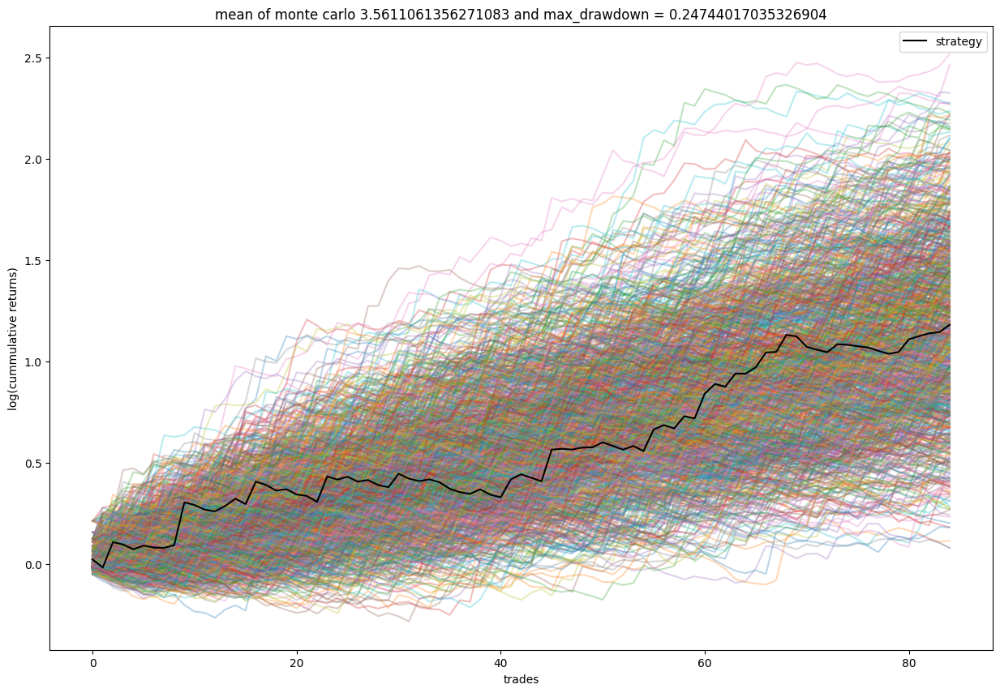

In [501]:
MC_sim('AAPL',150,'2000-01-01','2020-01-01',vol_type='garch',vol_lookback=252,replace=True)

In [502]:
VWAP_garchstop1_strategy_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_garchstop1_strategy_statistics.keys():
  VWAP_garchstop1_strategy_statistics[sector]={}
  for stock in eval(sector+'_stocks'):
    print(stock)
    VWAP_garchstop1_strategy_statistics[sector][stock]={}
    for lookback in strat_lookbacks:
      VWAP_garchstop1_strategy_statistics[sector][stock][lookback]={}
      for garch_lookback in Garch_lookbacks:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,vol_type='garch',vol_lookback=garch_lookback)
        VWAP_garchstop1_strategy_statistics[sector][stock][lookback][garch_lookback]=trade_stats

AAPL
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***

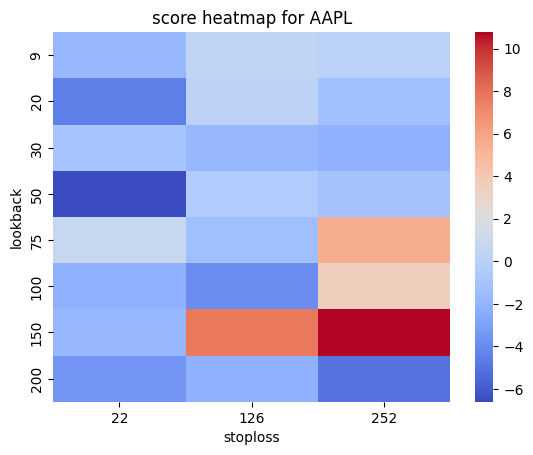

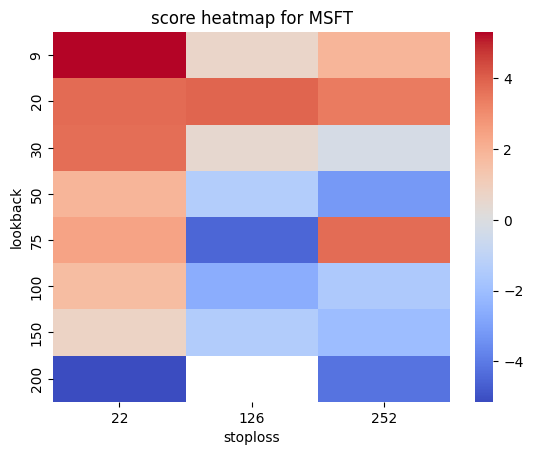

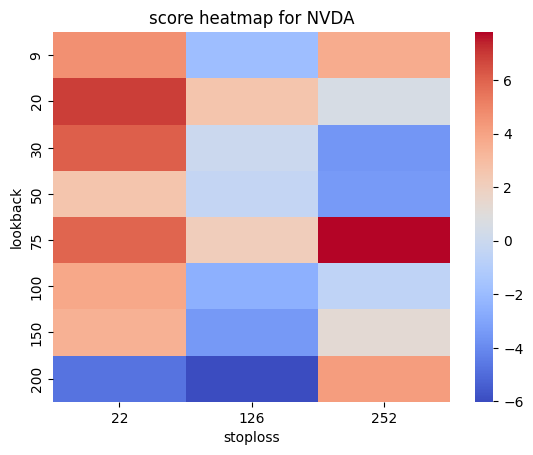

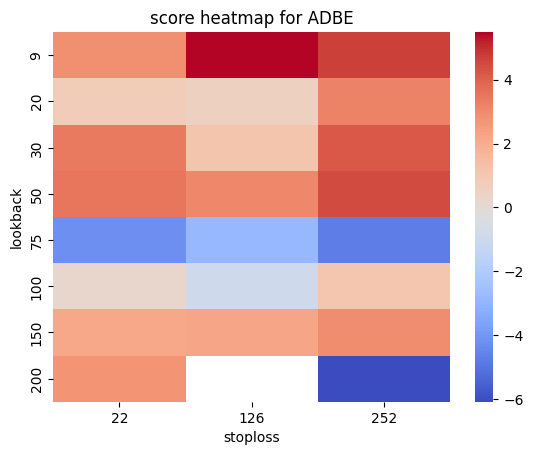

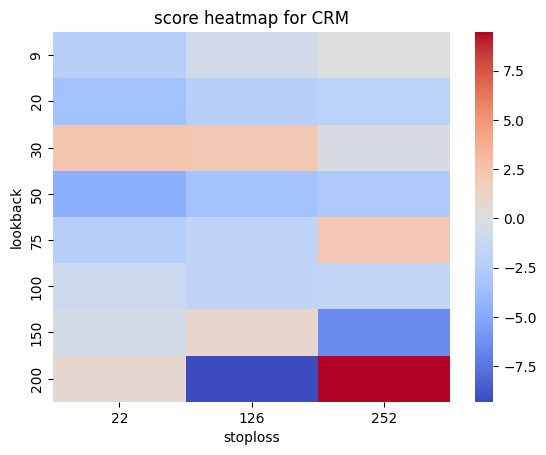

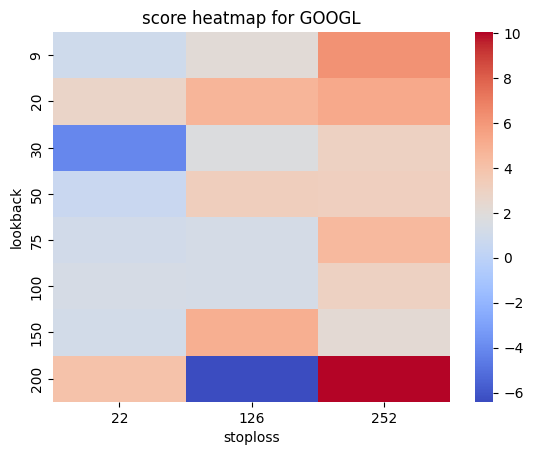

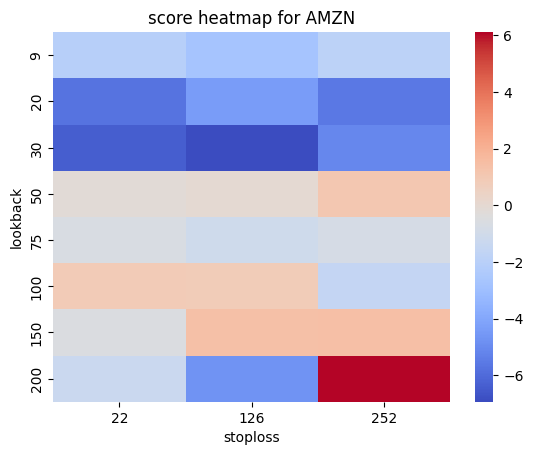

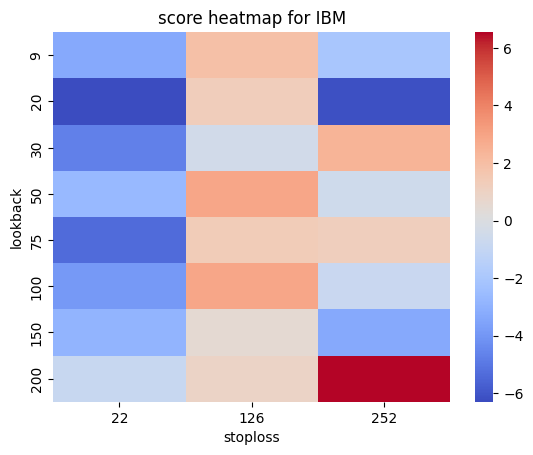

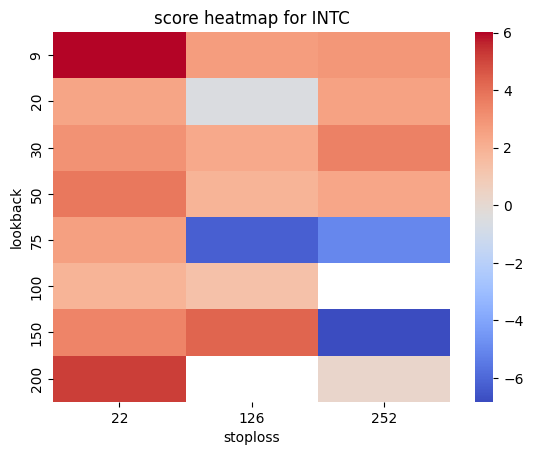

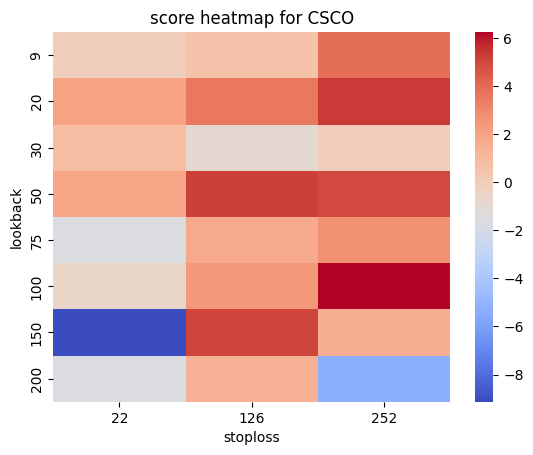

In [503]:
best_garchstop1_params={}
for sector in VWAP_garchstop1_strategy_statistics.keys():
  best_garchstop1_params[sector]={}
  a = VWAP_garchstop1_strategy_statistics[sector].keys()
  for stock in a:
    param_dict=parameter_search(VWAP_garchstop1_strategy_statistics[sector][stock],stock,'stoploss',weight)
    best_garchstop1_params[sector][stock+' strategy']=param_dict[0]
    best_garchstop1_params[sector][stock+' benchmark']=param_dict[1]
garchstop1_params={}
for sector in VWAP_garchstop1_strategy_statistics.keys():
  garchstop1_params[sector]=pd.DataFrame(best_garchstop1_params[sector])

In [504]:
stock='AAPL'
VWAP_garchstop1_strategy_time_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_garchstop1_strategy_time_statistics.keys():
  VWAP_garchstop1_strategy_time_statistics[sector]={}
  for i,date in enumerate(intervals[:-1]):
    start = intervals[i]
    end = intervals[i+1]
    VWAP_garchstop1_strategy_time_statistics[sector][date]={}
    for lookback in strat_lookbacks:
      VWAP_garchstop1_strategy_time_statistics[sector][date][lookback]={}
      for garch_lookback in Garch_lookbacks:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,vol_type='garch',vol_lookback=garch_lookback)
        VWAP_garchstop1_strategy_time_statistics[sector][date][lookback][garch_lookback]=trade_stats

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

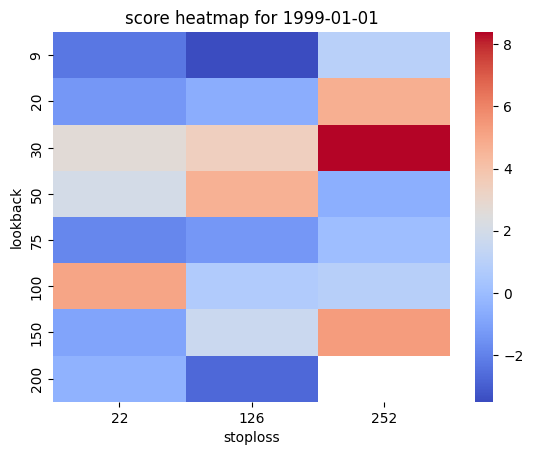

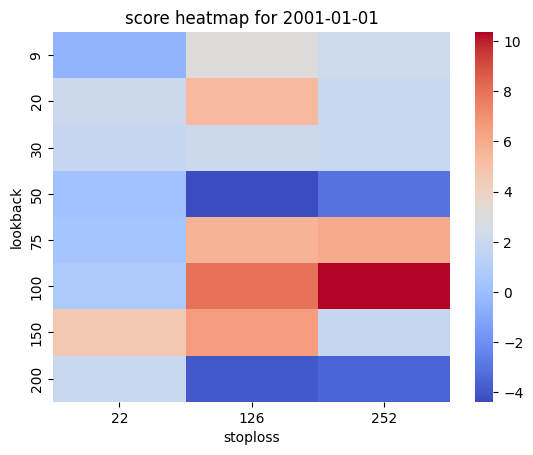

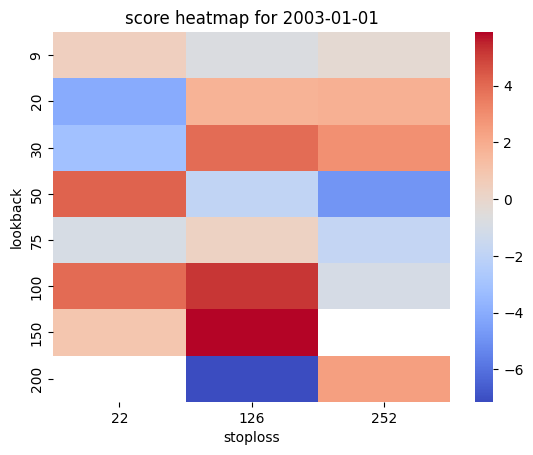

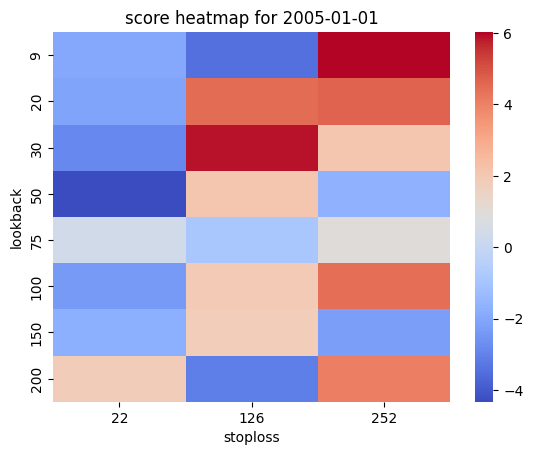

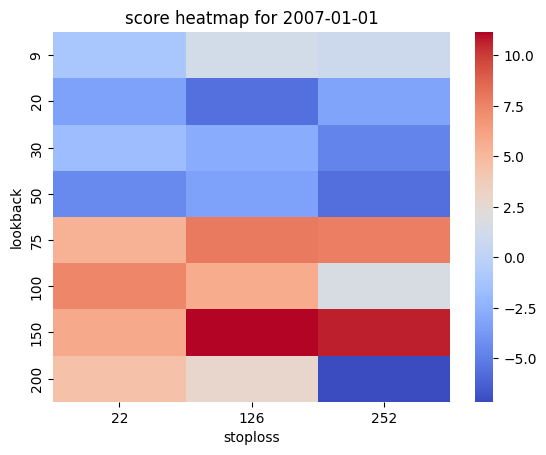

...

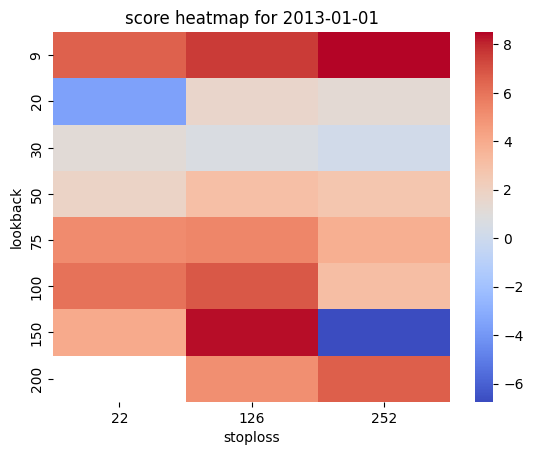

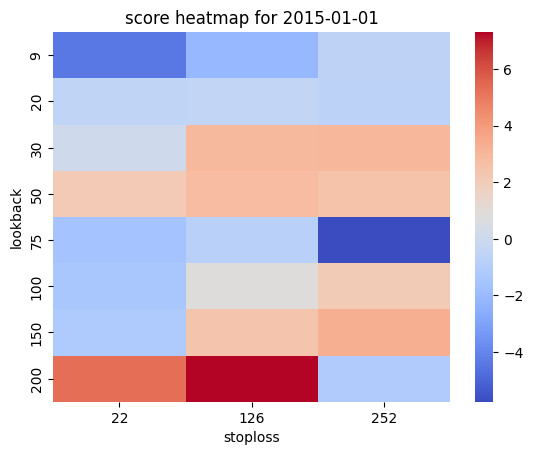

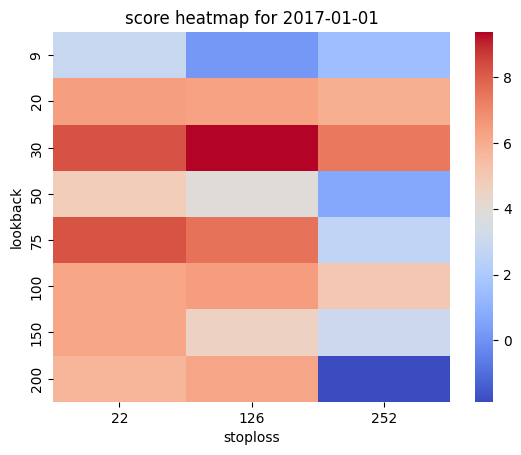

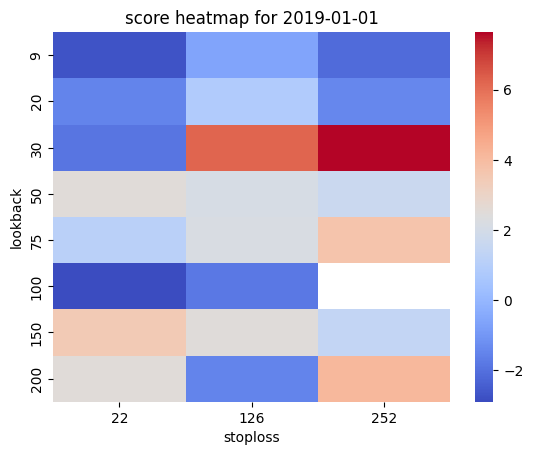

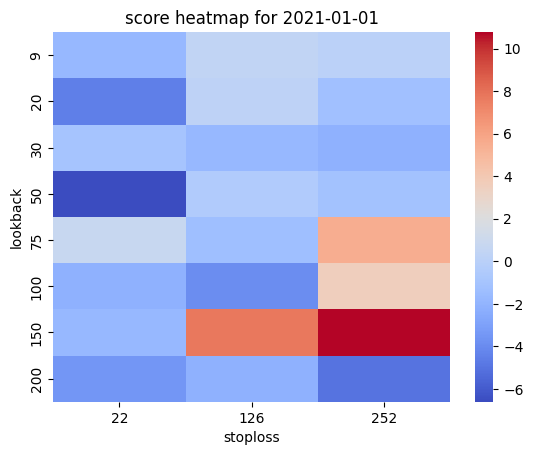

In [505]:
best_garchstop1_params_time={}
for sector in VWAP_garchstop1_strategy_time_statistics.keys():
  best_garchstop1_params_time[sector]={}
  a = VWAP_garchstop1_strategy_time_statistics[sector].keys()
  for date in a:
    param_dict=parameter_search(VWAP_garchstop1_strategy_time_statistics[sector][date],date,'stoploss',weight)
    best_garchstop1_params_time[sector][date+' strategy']=param_dict[0]
    best_garchstop1_params_time[sector][date+' benchmark']=param_dict[1]
garchstop1_params_time={}
for sector in VWAP_garchstop1_strategy_time_statistics.keys():
  garchstop1_params_time[sector]=pd.DataFrame(best_garchstop1_params_time[sector])

In [506]:
print_dataframe(garchstop1_params['Tech'])
print_dataframe(garchstop1_params_time['Tech'])

,AAPL strategy,AAPL benchmark,MSFT strategy,MSFT benchmark,NVDA strategy,NVDA benchmark,ADBE strategy,ADBE benchmark,CRM strategy,CRM benchmark,GOOGL strategy,GOOGL benchmark,AMZN strategy,AMZN benchmark,IBM strategy,IBM benchmark,INTC strategy,INTC benchmark,CSCO strategy,CSCO benchmark
lookback,150.000000,150.000000,9.000000,9.000000,75.000000,75.000000,9.000000,9.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,9.000000,9.000000,100.000000,100.000000
stoploss,252.000000,252.000000,22.000000,22.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,22.000000,22.000000,252.000000,252.000000
cummulative_returns,1.444909,0.785788,3.000286,0.984079,2.005223,0.658348,6.018571,0.555174,1.021691,0.900870,1.040483,0.882565,1.041656,0.738202,1.069169,1.159398,6.123344,0.423083,1.127070,1.088417
drawdowns_kurtosis,-1.710120,-0.161157,2.707143,-1.300092,1.560696,-0.822148,2.095985,-1.276308,47.019608,-1.476021,47.019608,-0.880164,47.019608,0.507186,39.316571,-0.043017,1.776272,-0.788790,1.333548,-0.333571
drawdowns_skewness,0.274654,-0.553292,1.752387,0.418605,1.364390,0.166818,1.584710,-0.350447,7.001400,-0.019656,7.001400,-0.120744,7.001400,-1.237666,6.118166,1.273939,1.479655,0.283560,1.563249,0.782038
max_drawdown,0.017359,0.277915,0.061591,0.375565,0.060985,0.477376,0.062523,0.600215,0.000912,0.223876,0.003413,0.201474,0.001564,0.321559,0.012129,0.077705,0.066544,0.633167,0.031467,0.204578
mean_returns,0.003663,-0.002091,0.002384,0.000137,0.004064,-0.001579,0.005017,-0.001248,0.000416,-0.001524,0.000770,-0.002028,0.000792,-0.005369,0.001301,0.002955,0.003921,-0.001589,0.000800,0.000677
sharpe_ratio,0.369381,-0.089735,0.219539,0.007409,0.250835,-0.039982,0.292381,-0.047938,0.159202,-0.049138,0.207241,-0.074520,0.217736,-0.177192,0.244395,0.202397,0.303065,-0.074608,0.157597,0.043674
sortino_ratio,1.408380,-0.158370,0.460405,0.012354,0.852786,-0.067689,0.881967,-0.070232,3.322908,-0.077992,1.643539,-0.122312,3.685182,-0.315098,0.935161,0.356875,0.763152,-0.115520,0.364186,0.089173


,1999-01-01 strategy,1999-01-01 benchmark,2001-01-01 strategy,2001-01-01 benchmark,2003-01-01 strategy,2003-01-01 benchmark,2005-01-01 strategy,2005-01-01 benchmark,2007-01-01 strategy,2007-01-01 benchmark,2009-01-01 strategy,2009-01-01 benchmark,2011-01-01 strategy,2011-01-01 benchmark,2013-01-01 strategy,2013-01-01 benchmark,2015-01-01 strategy,2015-01-01 benchmark,2017-01-01 strategy,2017-01-01 benchmark,2019-01-01 strategy,2019-01-01 benchmark,2021-01-01 strategy,2021-01-01 benchmark
lookback,30.000000,30.000000,100.000000,100.000000,150.000000,150.000000,9.000000,9.000000,150.000000,150.000000,150.000000,150.000000,200.000000,200.000000,9.000000,9.000000,200.000000,200.000000,30.000000,30.000000,30.000000,30.000000,150.000000,150.000000
stoploss,252.000000,252.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,126.000000,126.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000
cummulative_returns,2.623105,0.273563,1.449779,0.592149,1.071320,2.955485,2.354899,1.006525,1.322054,0.659787,1.189145,1.232556,1.178766,0.838380,1.742434,1.442256,1.057625,1.077596,1.458088,0.986800,1.684492,1.622127,1.444909,0.785788
drawdowns_kurtosis,-1.319454,-1.163902,3.563770,3.381059,135.034628,-0.673174,1.112074,-0.758929,-0.027424,-1.243499,20.565976,0.303266,12.903421,-0.756810,-0.256576,0.042315,174.005618,-1.063061,0.850180,5.048718,4.408424,-0.581306,-1.710120,-0.161157
drawdowns_skewness,-0.084987,0.520834,2.205382,-1.916291,11.475784,0.617260,1.373146,-0.104473,1.257701,0.693589,4.579164,1.108972,3.595598,-0.508968,0.964873,0.783555,13.266711,0.414849,1.433221,2.352029,1.767727,0.532085,0.274654,-0.553292
max_drawdown,0.052269,0.805808,0.026493,0.416737,0.002941,0.135312,0.096436,0.407992,0.024476,0.576279,0.017089,0.083362,0.017313,0.215762,0.033337,0.103308,0.002058,0.156725,0.038712,0.367303,0.043781,0.309525,0.017359,0.277915
mean_returns,0.004501,-0.003910,0.002543,-0.003040,0.000305,0.005067,0.003640,0.000310,0.001245,-0.001141,0.001702,0.002115,0.003289,-0.003173,0.002320,0.001596,0.000315,0.000503,0.001102,0.000096,0.002394,0.002630,0.003663,-0.002091
sharpe_ratio,0.242349,-0.070397,0.258904,-0.100374,0.109646,0.196603,0.244788,0.012951,0.171900,-0.031229,0.275455,0.164172,0.298955,-0.134512,0.252308,0.116683,0.170328,0.038505,0.202596,0.005861,0.208871,0.086005,0.369381,-0.089735
sortino_ratio,0.710830,-0.093642,0.798190,-0.147406,1.350072,0.462403,0.546762,0.025099,0.684528,-0.050640,0.857119,0.312767,1.232759,-0.225721,0.757254,0.197519,2.052088,0.063871,0.507467,0.009470,0.603790,0.144762,1.408380,-0.158370


# Garch Volatility with multiplier of 2

[*********************100%***********************]  1 of 1 completed
   direction entry date  entry price  stop loss  exit date  exit price  \
1       long 2010-02-17     7.292500   7.026993 2010-02-23    7.142857   
1      short 2010-02-23     7.142857   7.273989 2010-02-25    7.222670   
2       long 2010-02-26     7.227857   7.062419 2010-03-15    7.912984   
3       long 2010-03-23     8.058571   7.888472 2010-03-25    8.089521   
2      short 2010-05-04     9.388929  10.057824 2010-05-11    9.159286   
..       ...        ...          ...        ...        ...         ...   
84      long 2014-10-09    25.385000  24.671098 2014-10-14   24.767377   
87     short 2014-10-15    24.492500  25.097438 2014-10-17   24.494162   
85      long 2014-10-21    25.754999  24.989045 2014-11-14   27.921411   
88     short 2014-12-02    28.375000  29.136766 2014-12-04   29.136766   
86      long 2014-12-18    27.967501  27.075828        NaT         NaN   

      return  
1  -0.020520  
1  -0.011174

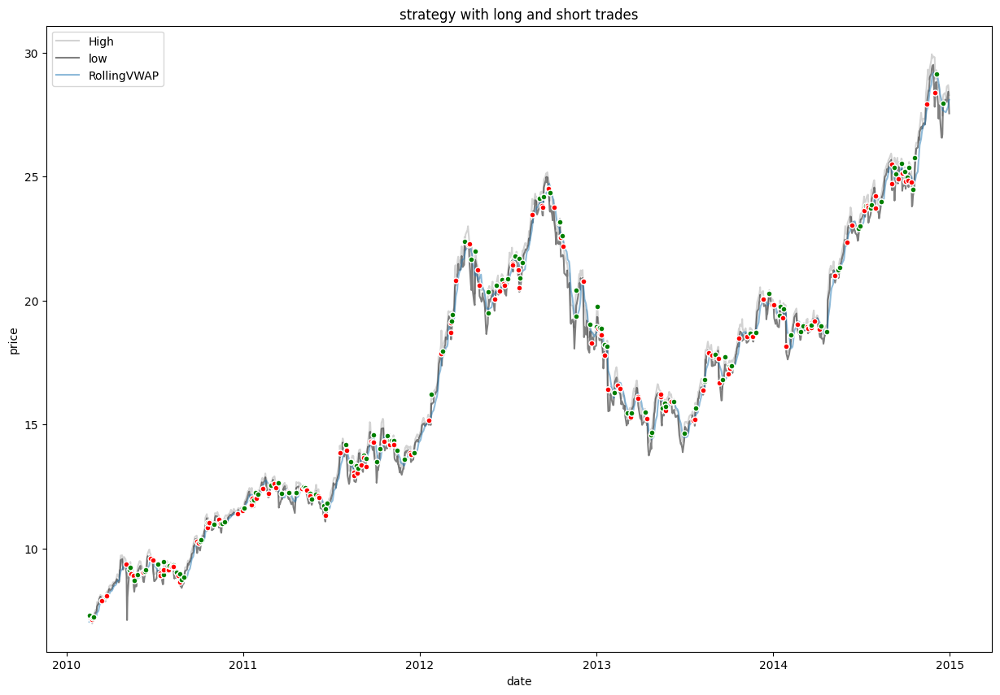

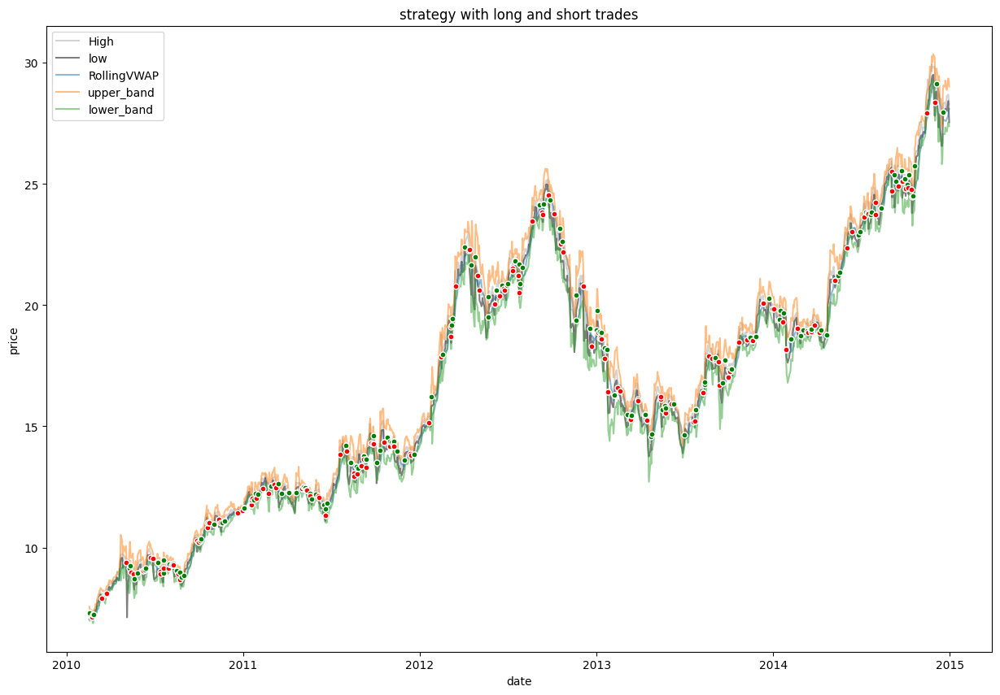

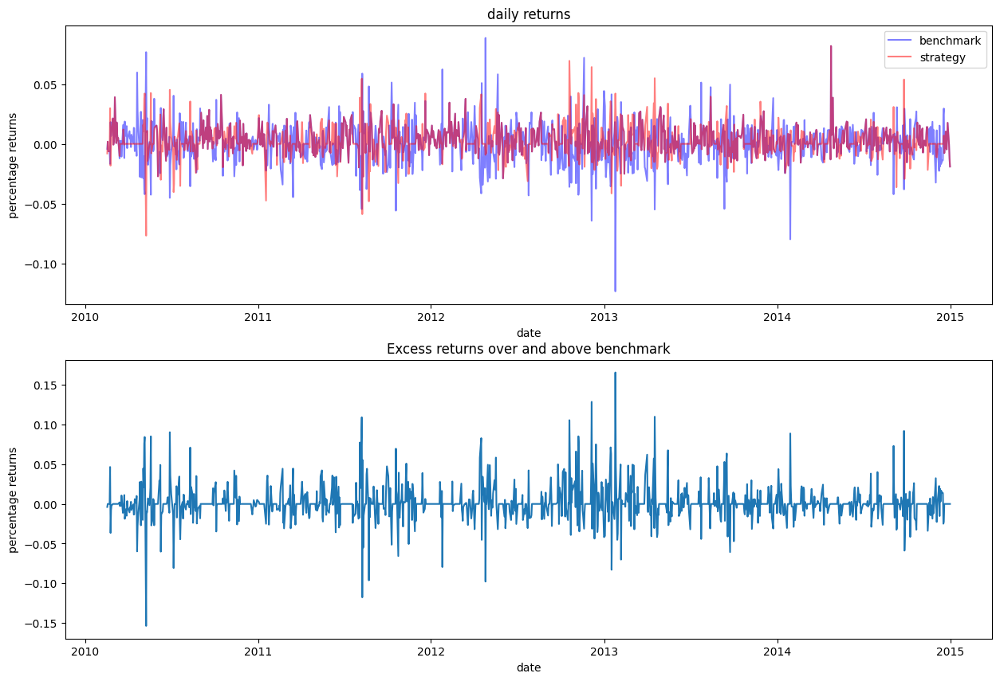

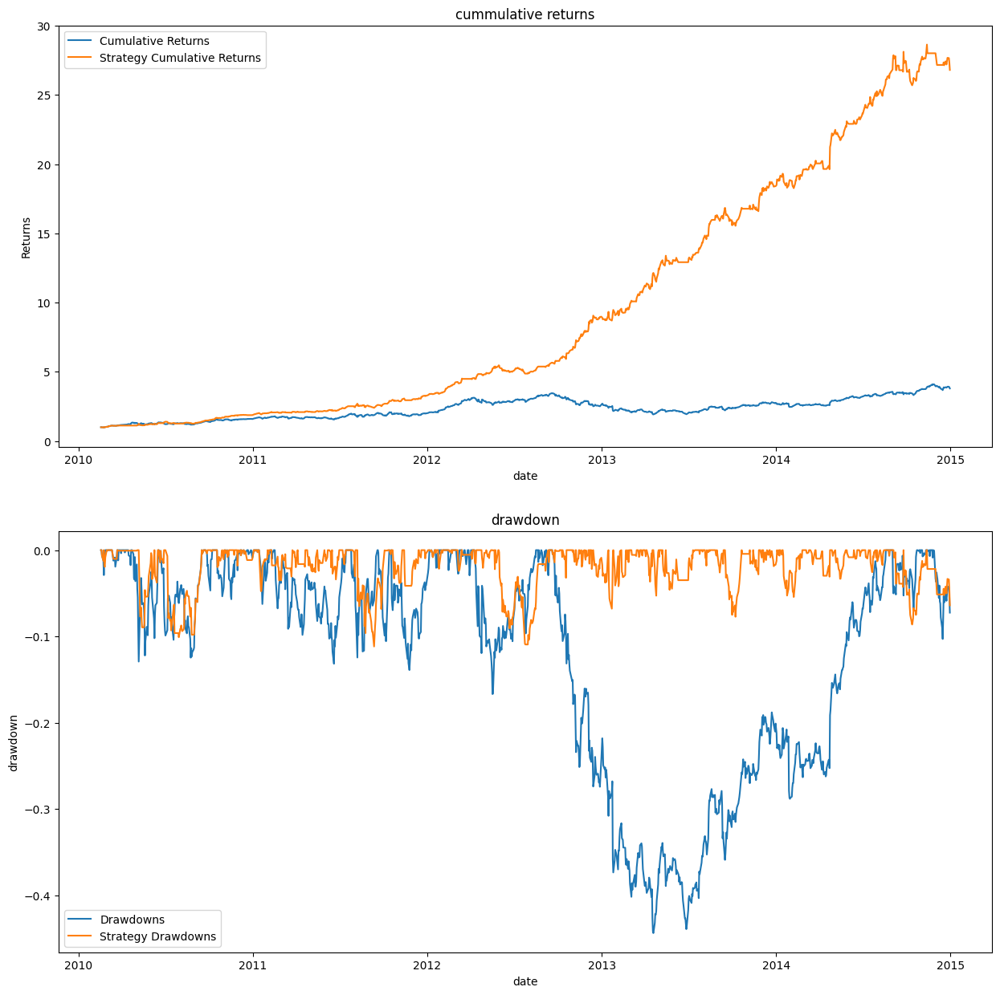

{'mean_returns': {'benchmark': 0.0012265068569336703, 'strategy': 0.00276480312104885}, 'cummulative_returns': {'benchmark': 3.798721465071738, 'strategy': 26.80845677107264}, 'sharpe_ratio': {'benchmark': 0.07358873803882611, 'strategy': 0.2138205913159705}, 'sortino_ratio': {'benchmark': 0.1253898189624312, 'strategy': 0.4176255211052703}, 'max_drawdown': {'benchmark': 0.44376870171441485, 'strategy': 0.11162334711173157}, 'drawdowns_kurtosis': {'benchmark': -0.47797202803540584, 'strategy': 1.5776644279501317}, 'drawdowns_skewness': {'benchmark': 0.9372963390547321, 'strategy': 1.5142418946899197}}


In [507]:
_,garch_trades,_=run_backtest('AAPL',lookback=9,start='2010-01-01',end='2015-01-01',print_trades=False,stoploss_pct=None,vol_type='garch',vol_lookback=22,vol_multiplier=2,leverage=1,display_trades=True,show_plots=True,print_stats=True)

[*********************100%***********************]  1 of 1 completed


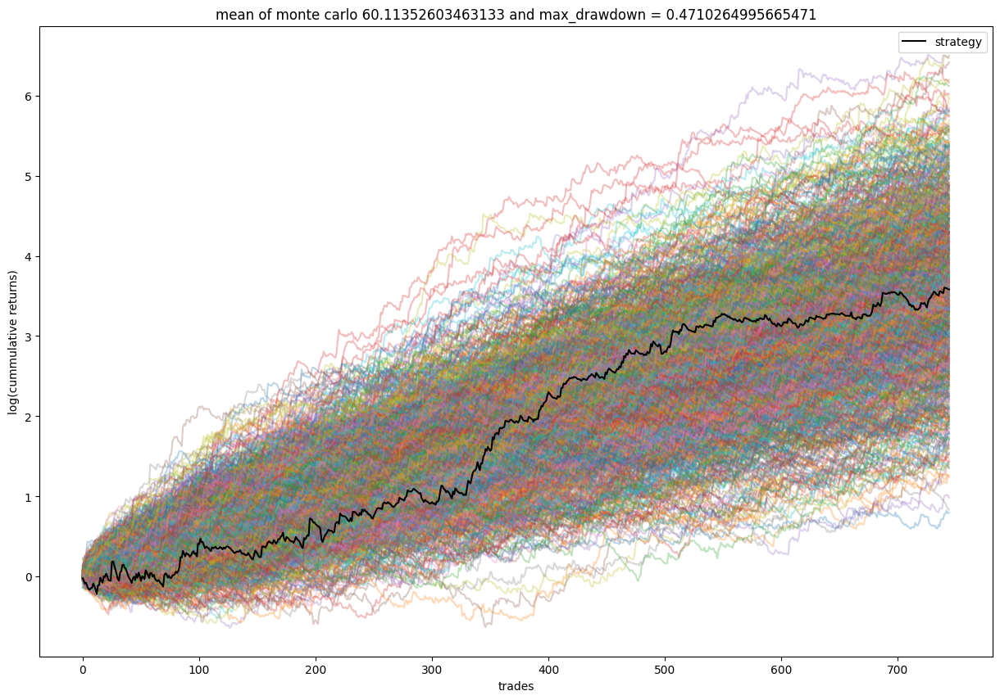

In [508]:
MC_sim('AAPL',9,'2000-01-01','2020-01-01',vol_type='garch',vol_lookback=22,replace=True)

In [509]:
VWAP_garchstop2_strategy_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_garchstop2_strategy_statistics.keys():
  VWAP_garchstop2_strategy_statistics[sector]={}
  for stock in eval(sector+'_stocks'):
    print(stock)
    VWAP_garchstop2_strategy_statistics[sector][stock]={}
    for lookback in strat_lookbacks:
      VWAP_garchstop2_strategy_statistics[sector][stock][lookback]={}
      for garch_lookback in Garch_lookbacks:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,vol_type='garch',vol_lookback=garch_lookback,vol_multiplier=2)
        VWAP_garchstop2_strategy_statistics[sector][stock][lookback][garch_lookback]=trade_stats

AAPL
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***

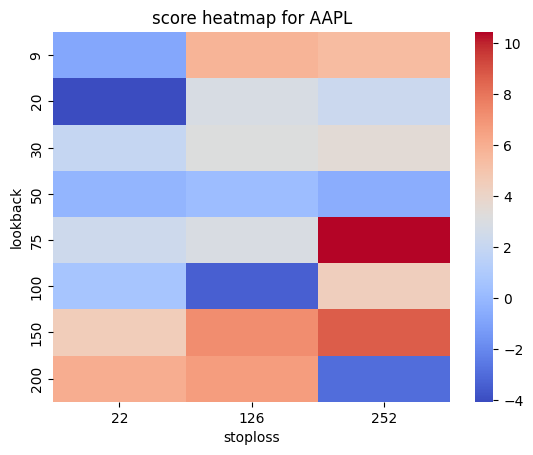

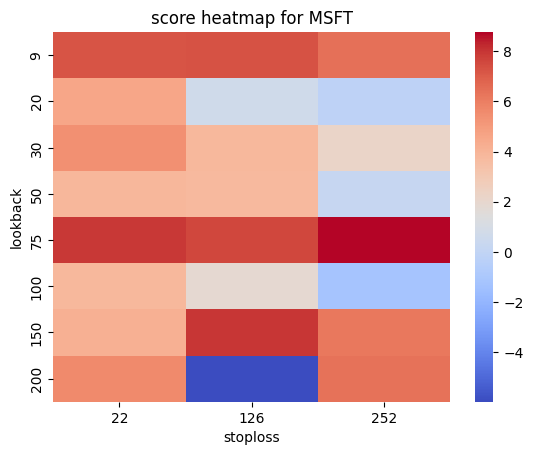

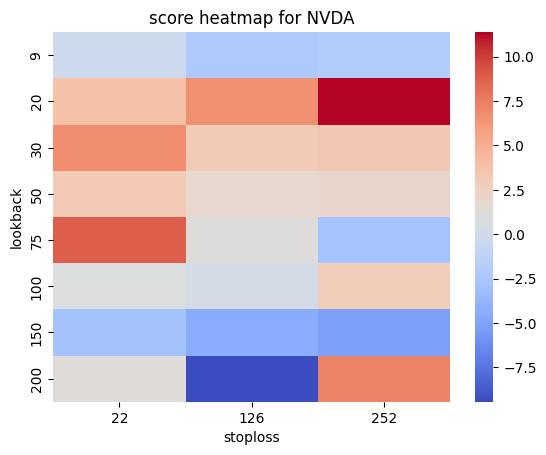

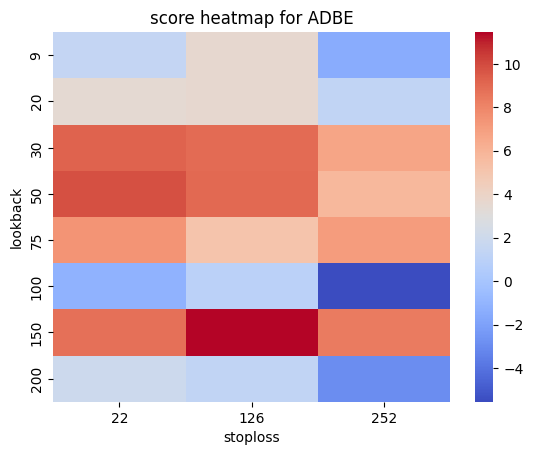

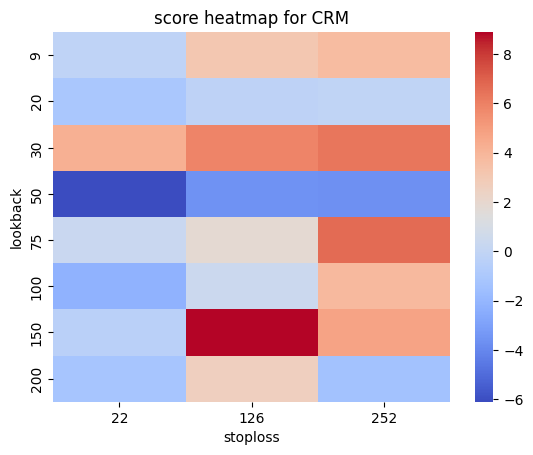

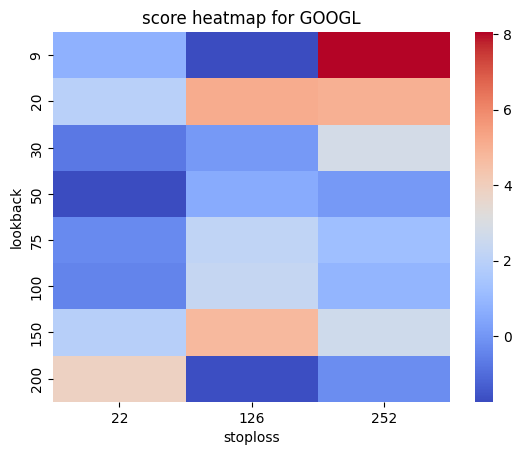

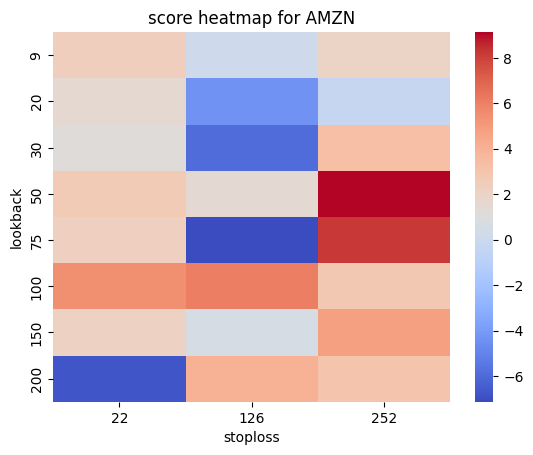

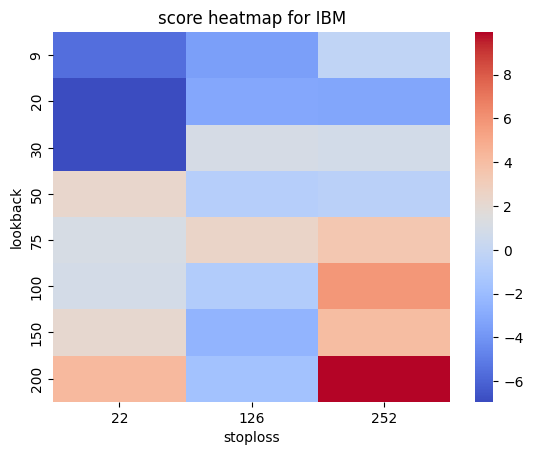

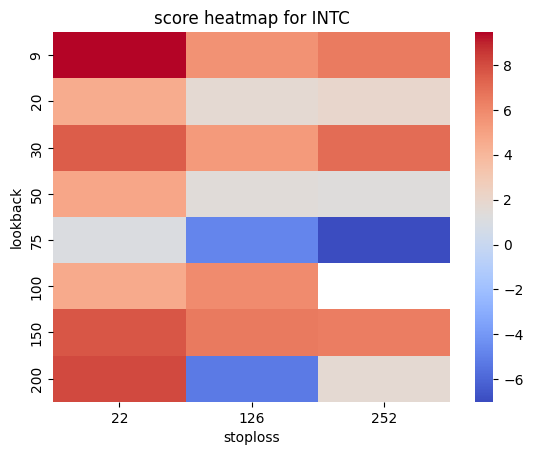

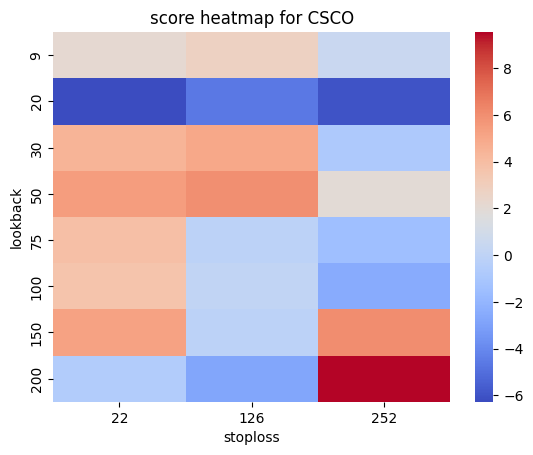

In [510]:
best_garchstop2_params={}
for sector in VWAP_garchstop2_strategy_statistics.keys():
  best_garchstop2_params[sector]={}
  a = VWAP_garchstop2_strategy_statistics[sector].keys()
  for stock in a:
    param_dict=parameter_search(VWAP_garchstop2_strategy_statistics[sector][stock],stock,'stoploss',weight)
    best_garchstop2_params[sector][stock+' strategy']=param_dict[0]
    best_garchstop1_params[sector][stock+' benchmark']=param_dict[1]
garchstop2_params={}
for sector in VWAP_garchstop2_strategy_statistics.keys():
  garchstop2_params[sector]=pd.DataFrame(best_garchstop2_params[sector])

In [511]:
stock='AAPL'
VWAP_garchstop2_strategy_time_statistics=dict.fromkeys(sectors[:1])
for sector in VWAP_garchstop2_strategy_time_statistics.keys():
  VWAP_garchstop2_strategy_time_statistics[sector]={}
  for i,date in enumerate(intervals[:-1]):
    start = intervals[i]
    end = intervals[i+1]
    VWAP_garchstop2_strategy_time_statistics[sector][date]={}
    for lookback in strat_lookbacks:
      VWAP_garchstop2_strategy_time_statistics[sector][date][lookback]={}
      for garch_lookback in Garch_lookbacks:
        trade_stats,_,_=run_backtest(stock,lookback,start,end,vol_type='garch',vol_lookback=garch_lookback,vol_multiplier=2)
        VWAP_garchstop2_strategy_time_statistics[sector][date][lookback][garch_lookback]=trade_stats

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

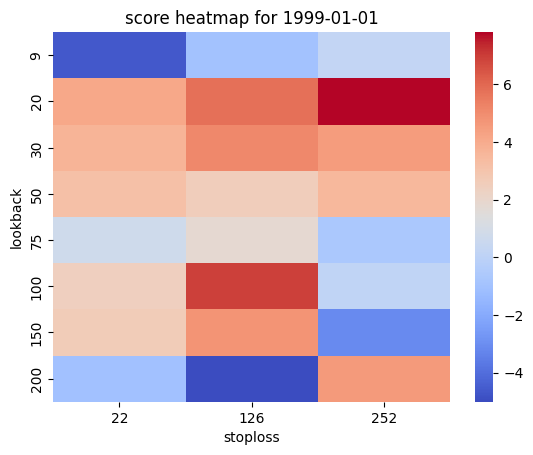

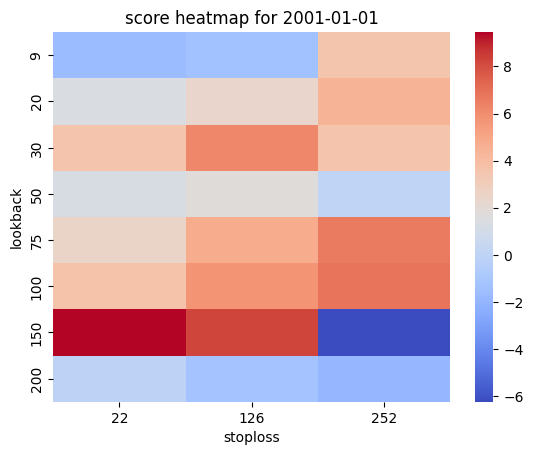

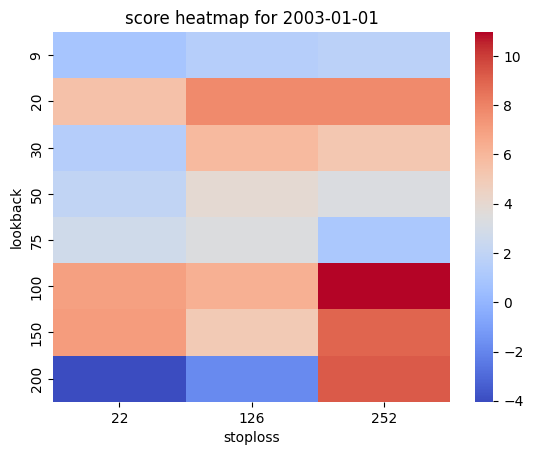

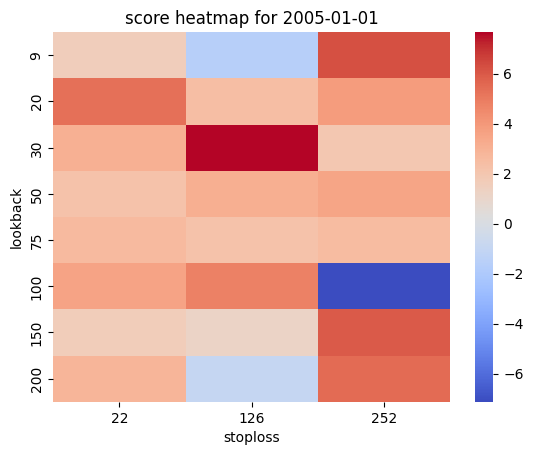

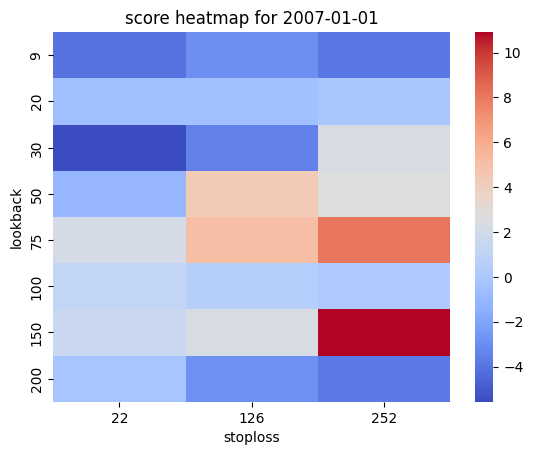

...

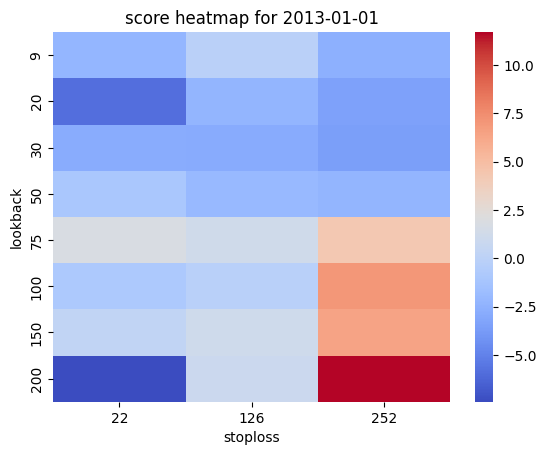

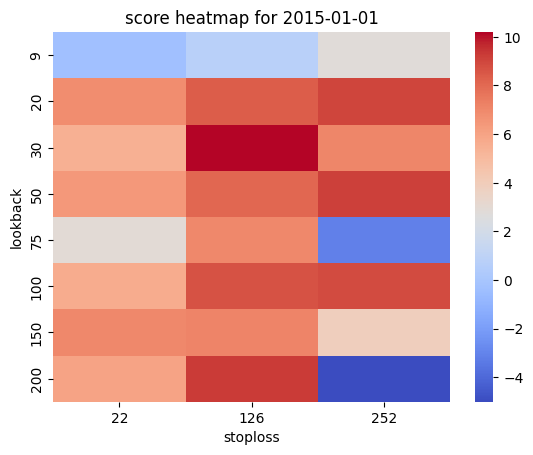

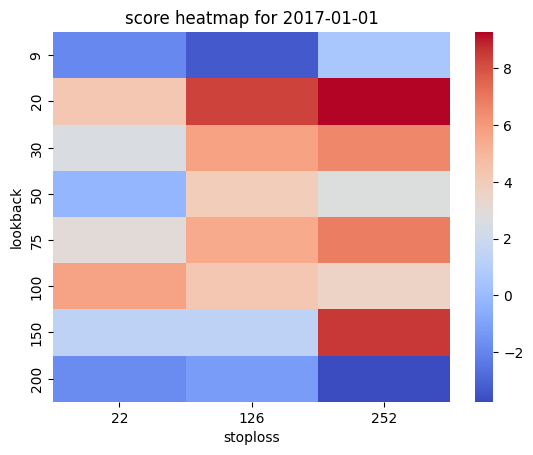

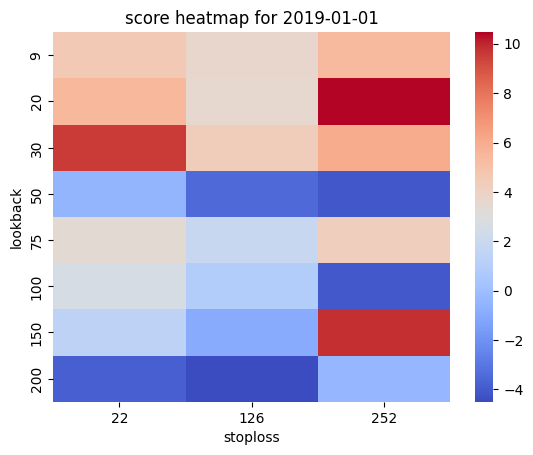

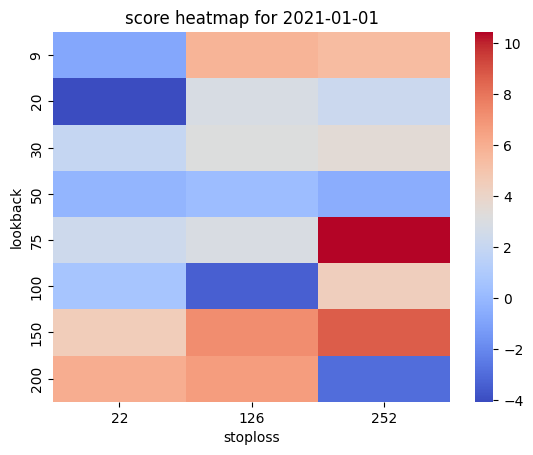

In [512]:
best_garchstop2_params_time={}
for sector in VWAP_garchstop2_strategy_time_statistics.keys():
  best_garchstop2_params_time[sector]={}
  a = VWAP_garchstop2_strategy_time_statistics[sector].keys()
  for date in a:
    param_dict=parameter_search(VWAP_garchstop2_strategy_time_statistics[sector][date],date,'stoploss',weight)
    best_garchstop2_params_time[sector][date+' strategy']=param_dict[0]
    best_garchstop2_params_time[sector][date+' benchmark']=param_dict[1]
garchstop2_params_time={}
for sector in VWAP_garchstop2_strategy_time_statistics.keys():
  garchstop2_params_time[sector]=pd.DataFrame(best_garchstop2_params_time[sector])

In [513]:
print_dataframe(garchstop1_params['Tech'])
print_dataframe(garchstop1_params_time['Tech'])

,AAPL strategy,AAPL benchmark,MSFT strategy,MSFT benchmark,NVDA strategy,NVDA benchmark,ADBE strategy,ADBE benchmark,CRM strategy,CRM benchmark,GOOGL strategy,GOOGL benchmark,AMZN strategy,AMZN benchmark,IBM strategy,IBM benchmark,INTC strategy,INTC benchmark,CSCO strategy,CSCO benchmark
lookback,150.000000,150.000000,9.000000,9.000000,75.000000,75.000000,9.000000,9.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,9.000000,9.000000,100.000000,100.000000
stoploss,252.000000,252.000000,22.000000,22.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,22.000000,22.000000,252.000000,252.000000
cummulative_returns,1.444909,0.785788,3.000286,0.984079,2.005223,0.658348,6.018571,0.555174,1.021691,0.900870,1.040483,0.882565,1.041656,0.738202,1.069169,1.159398,6.123344,0.423083,1.127070,1.088417
drawdowns_kurtosis,-1.710120,-0.161157,2.707143,-1.300092,1.560696,-0.822148,2.095985,-1.276308,47.019608,-1.476021,47.019608,-0.880164,47.019608,0.507186,39.316571,-0.043017,1.776272,-0.788790,1.333548,-0.333571
drawdowns_skewness,0.274654,-0.553292,1.752387,0.418605,1.364390,0.166818,1.584710,-0.350447,7.001400,-0.019656,7.001400,-0.120744,7.001400,-1.237666,6.118166,1.273939,1.479655,0.283560,1.563249,0.782038
max_drawdown,0.017359,0.277915,0.061591,0.375565,0.060985,0.477376,0.062523,0.600215,0.000912,0.223876,0.003413,0.201474,0.001564,0.321559,0.012129,0.077705,0.066544,0.633167,0.031467,0.204578
mean_returns,0.003663,-0.002091,0.002384,0.000137,0.004064,-0.001579,0.005017,-0.001248,0.000416,-0.001524,0.000770,-0.002028,0.000792,-0.005369,0.001301,0.002955,0.003921,-0.001589,0.000800,0.000677
sharpe_ratio,0.369381,-0.089735,0.219539,0.007409,0.250835,-0.039982,0.292381,-0.047938,0.159202,-0.049138,0.207241,-0.074520,0.217736,-0.177192,0.244395,0.202397,0.303065,-0.074608,0.157597,0.043674
sortino_ratio,1.408380,-0.158370,0.460405,0.012354,0.852786,-0.067689,0.881967,-0.070232,3.322908,-0.077992,1.643539,-0.122312,3.685182,-0.315098,0.935161,0.356875,0.763152,-0.115520,0.364186,0.089173


,1999-01-01 strategy,1999-01-01 benchmark,2001-01-01 strategy,2001-01-01 benchmark,2003-01-01 strategy,2003-01-01 benchmark,2005-01-01 strategy,2005-01-01 benchmark,2007-01-01 strategy,2007-01-01 benchmark,2009-01-01 strategy,2009-01-01 benchmark,2011-01-01 strategy,2011-01-01 benchmark,2013-01-01 strategy,2013-01-01 benchmark,2015-01-01 strategy,2015-01-01 benchmark,2017-01-01 strategy,2017-01-01 benchmark,2019-01-01 strategy,2019-01-01 benchmark,2021-01-01 strategy,2021-01-01 benchmark
lookback,30.000000,30.000000,100.000000,100.000000,150.000000,150.000000,9.000000,9.000000,150.000000,150.000000,150.000000,150.000000,200.000000,200.000000,9.000000,9.000000,200.000000,200.000000,30.000000,30.000000,30.000000,30.000000,150.000000,150.000000
stoploss,252.000000,252.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,126.000000,126.000000,126.000000,126.000000,252.000000,252.000000,252.000000,252.000000
cummulative_returns,2.623105,0.273563,1.449779,0.592149,1.071320,2.955485,2.354899,1.006525,1.322054,0.659787,1.189145,1.232556,1.178766,0.838380,1.742434,1.442256,1.057625,1.077596,1.458088,0.986800,1.684492,1.622127,1.444909,0.785788
drawdowns_kurtosis,-1.319454,-1.163902,3.563770,3.381059,135.034628,-0.673174,1.112074,-0.758929,-0.027424,-1.243499,20.565976,0.303266,12.903421,-0.756810,-0.256576,0.042315,174.005618,-1.063061,0.850180,5.048718,4.408424,-0.581306,-1.710120,-0.161157
drawdowns_skewness,-0.084987,0.520834,2.205382,-1.916291,11.475784,0.617260,1.373146,-0.104473,1.257701,0.693589,4.579164,1.108972,3.595598,-0.508968,0.964873,0.783555,13.266711,0.414849,1.433221,2.352029,1.767727,0.532085,0.274654,-0.553292
max_drawdown,0.052269,0.805808,0.026493,0.416737,0.002941,0.135312,0.096436,0.407992,0.024476,0.576279,0.017089,0.083362,0.017313,0.215762,0.033337,0.103308,0.002058,0.156725,0.038712,0.367303,0.043781,0.309525,0.017359,0.277915
mean_returns,0.004501,-0.003910,0.002543,-0.003040,0.000305,0.005067,0.003640,0.000310,0.001245,-0.001141,0.001702,0.002115,0.003289,-0.003173,0.002320,0.001596,0.000315,0.000503,0.001102,0.000096,0.002394,0.002630,0.003663,-0.002091
sharpe_ratio,0.242349,-0.070397,0.258904,-0.100374,0.109646,0.196603,0.244788,0.012951,0.171900,-0.031229,0.275455,0.164172,0.298955,-0.134512,0.252308,0.116683,0.170328,0.038505,0.202596,0.005861,0.208871,0.086005,0.369381,-0.089735
sortino_ratio,0.710830,-0.093642,0.798190,-0.147406,1.350072,0.462403,0.546762,0.025099,0.684528,-0.050640,0.857119,0.312767,1.232759,-0.225721,0.757254,0.197519,2.052088,0.063871,0.507467,0.009470,0.603790,0.144762,1.408380,-0.158370
